**Importing Libraries**

In [39]:
import torch
import torch.nn as nn
import torch.optim as optim
import torchvision
import torchvision.transforms as transforms
import matplotlib.pyplot as plt
import numpy as np

**Data Preparation**

In [40]:

trainset = torchvision.datasets.MNIST(root = './data',train = True, download = True, transform = transforms.ToTensor())


In [41]:
trainset[0]

(tensor([[[0.0000, 0.0000, 0.0000, 0.0000, 0.0000, 0.0000, 0.0000, 0.0000,
           0.0000, 0.0000, 0.0000, 0.0000, 0.0000, 0.0000, 0.0000, 0.0000,
           0.0000, 0.0000, 0.0000, 0.0000, 0.0000, 0.0000, 0.0000, 0.0000,
           0.0000, 0.0000, 0.0000, 0.0000],
          [0.0000, 0.0000, 0.0000, 0.0000, 0.0000, 0.0000, 0.0000, 0.0000,
           0.0000, 0.0000, 0.0000, 0.0000, 0.0000, 0.0000, 0.0000, 0.0000,
           0.0000, 0.0000, 0.0000, 0.0000, 0.0000, 0.0000, 0.0000, 0.0000,
           0.0000, 0.0000, 0.0000, 0.0000],
          [0.0000, 0.0000, 0.0000, 0.0000, 0.0000, 0.0000, 0.0000, 0.0000,
           0.0000, 0.0000, 0.0000, 0.0000, 0.0000, 0.0000, 0.0000, 0.0000,
           0.0000, 0.0000, 0.0000, 0.0000, 0.0000, 0.0000, 0.0000, 0.0000,
           0.0000, 0.0000, 0.0000, 0.0000],
          [0.0000, 0.0000, 0.0000, 0.0000, 0.0000, 0.0000, 0.0000, 0.0000,
           0.0000, 0.0000, 0.0000, 0.0000, 0.0000, 0.0000, 0.0000, 0.0000,
           0.0000, 0.0000, 0.0000, 0.0000, 

In [42]:
image,label = trainset[0]
print(image.shape)

torch.Size([1, 28, 28])


In [43]:
len(trainset)

60000

In [44]:
trainloader = torch.utils.data.DataLoader(trainset,batch_size=64,shuffle=True)

**Model Development**

In [45]:
class GenBlock(nn.Module):
  def __init__(self,in_features,out_features):
    super(GenBlock,self).__init__()
    self.main = nn.Sequential(
        nn.Linear(in_features,out_features),
        nn.ReLU(True)
    )

  def forward(self,x):
    return self.main(x)


In [46]:
class Generator(nn.Module):
  def __init__(self):
    super(Generator,self).__init__()
    self.main = nn.Sequential(
        GenBlock(100,256),
        GenBlock(256,512),
        GenBlock(512,1024),
        nn.Linear(1024,28*28),
        nn.Tanh()  #Transforming the values in the range of -1 and 1
    )

  def forward(self,input):
    return self.main(input).view(-1,1,28,28)


In [64]:
class DisBlock(nn.Module):
  def __init__(self,in_features,out_features):
    super(DisBlock,self).__init__()
    self.main = nn.Sequential(
        nn.Linear(in_features,out_features),
        nn.LeakyReLU(0.2,inplace=True),
        nn.Dropout(0.2)
    )

  def forward(self,x):
    return self.main(x)

In [70]:
class Discriminator(nn.Module):
  def __init__(self):
    super(Discriminator,self).__init__()
    self.main = nn.Sequential(
        DisBlock(28*28,1024),
        DisBlock(1024,512),
        DisBlock(512,256),
        nn.Linear(256,1),
        nn.Sigmoid()

    )

  def forward(self,input):
    return self.main(input.view(-1,28*28))

**Initialization**

In [69]:
generator = Generator()
discriminator = Discriminator()

criterion = nn.BCELoss()

OptimizerG = optim.Adam(generator.parameters(),lr=0.0002)
OptimizerD = optim.Adam(discriminator.parameters(),lr=0.0002)

**Training**

Epoch [0/80] Batch 0/938             Loss D: 0.7119, Loss G: 2.4566
Epoch [0/80] Batch 100/938             Loss D: 0.5366, Loss G: 2.0688
Epoch [0/80] Batch 200/938             Loss D: 0.2981, Loss G: 4.9416
Epoch [0/80] Batch 300/938             Loss D: 0.9227, Loss G: 2.8976
Epoch [0/80] Batch 400/938             Loss D: 0.1295, Loss G: 3.8839
Epoch [0/80] Batch 500/938             Loss D: 1.5559, Loss G: 5.4917
Epoch [0/80] Batch 600/938             Loss D: 0.1345, Loss G: 3.3069
Epoch [0/80] Batch 700/938             Loss D: 0.1042, Loss G: 4.1305
Epoch [0/80] Batch 800/938             Loss D: 0.4064, Loss G: 5.2637
Epoch [0/80] Batch 900/938             Loss D: 0.2249, Loss G: 4.1298


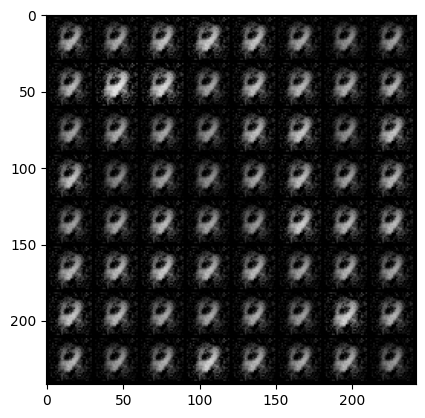

Epoch [1/80] Batch 0/938             Loss D: 0.5325, Loss G: 4.4953
Epoch [1/80] Batch 100/938             Loss D: 0.7860, Loss G: 2.7945
Epoch [1/80] Batch 200/938             Loss D: 0.3437, Loss G: 4.8250
Epoch [1/80] Batch 300/938             Loss D: 0.7816, Loss G: 3.4066
Epoch [1/80] Batch 400/938             Loss D: 0.1941, Loss G: 2.6819
Epoch [1/80] Batch 500/938             Loss D: 1.0089, Loss G: 3.4799
Epoch [1/80] Batch 600/938             Loss D: 0.4128, Loss G: 2.6084
Epoch [1/80] Batch 700/938             Loss D: 0.3685, Loss G: 2.6904
Epoch [1/80] Batch 800/938             Loss D: 0.1351, Loss G: 5.7649
Epoch [1/80] Batch 900/938             Loss D: 0.8187, Loss G: 7.7401


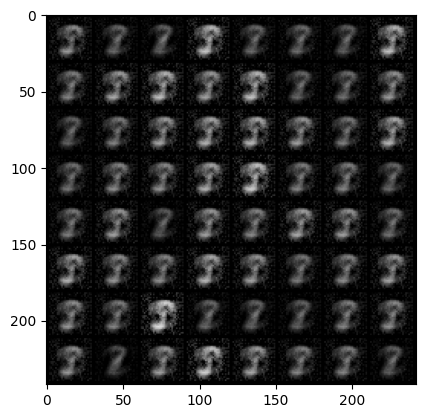

Epoch [2/80] Batch 0/938             Loss D: 0.6152, Loss G: 1.6934
Epoch [2/80] Batch 100/938             Loss D: 0.3548, Loss G: 3.4862
Epoch [2/80] Batch 200/938             Loss D: 0.6558, Loss G: 3.1565
Epoch [2/80] Batch 300/938             Loss D: 0.3842, Loss G: 2.1567
Epoch [2/80] Batch 400/938             Loss D: 0.4641, Loss G: 3.1677
Epoch [2/80] Batch 500/938             Loss D: 0.3769, Loss G: 3.7934
Epoch [2/80] Batch 600/938             Loss D: 1.3820, Loss G: 2.2074
Epoch [2/80] Batch 700/938             Loss D: 0.4934, Loss G: 2.2172
Epoch [2/80] Batch 800/938             Loss D: 0.3180, Loss G: 2.9548
Epoch [2/80] Batch 900/938             Loss D: 0.1076, Loss G: 4.0017


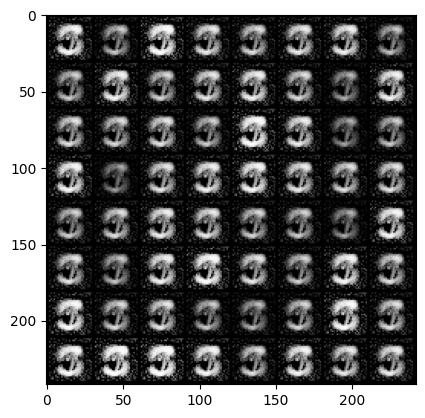

Epoch [3/80] Batch 0/938             Loss D: 0.1456, Loss G: 5.1892
Epoch [3/80] Batch 100/938             Loss D: 0.5497, Loss G: 2.6709
Epoch [3/80] Batch 200/938             Loss D: 0.2002, Loss G: 3.1431
Epoch [3/80] Batch 300/938             Loss D: 0.2986, Loss G: 2.4110
Epoch [3/80] Batch 400/938             Loss D: 1.1801, Loss G: 4.7792
Epoch [3/80] Batch 500/938             Loss D: 0.1455, Loss G: 3.0122
Epoch [3/80] Batch 600/938             Loss D: 0.3466, Loss G: 6.6745
Epoch [3/80] Batch 700/938             Loss D: 1.3642, Loss G: 1.6949
Epoch [3/80] Batch 800/938             Loss D: 0.2520, Loss G: 3.2276
Epoch [3/80] Batch 900/938             Loss D: 0.7373, Loss G: 3.4085


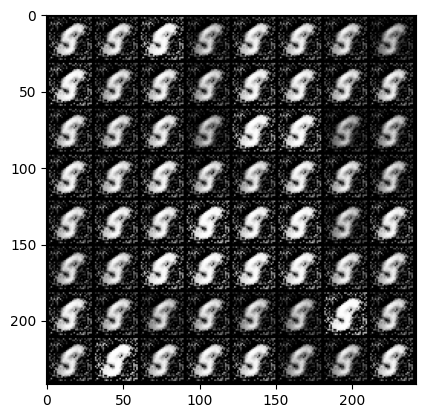

Epoch [4/80] Batch 0/938             Loss D: 0.2380, Loss G: 4.4916
Epoch [4/80] Batch 100/938             Loss D: 0.1560, Loss G: 3.5536
Epoch [4/80] Batch 200/938             Loss D: 0.4317, Loss G: 3.4024
Epoch [4/80] Batch 300/938             Loss D: 0.3013, Loss G: 4.8404
Epoch [4/80] Batch 400/938             Loss D: 0.4801, Loss G: 2.0679
Epoch [4/80] Batch 500/938             Loss D: 0.0831, Loss G: 3.6987
Epoch [4/80] Batch 600/938             Loss D: 0.6376, Loss G: 5.7679
Epoch [4/80] Batch 700/938             Loss D: 0.3148, Loss G: 2.3687
Epoch [4/80] Batch 800/938             Loss D: 0.3886, Loss G: 3.3256
Epoch [4/80] Batch 900/938             Loss D: 0.8133, Loss G: 4.5954


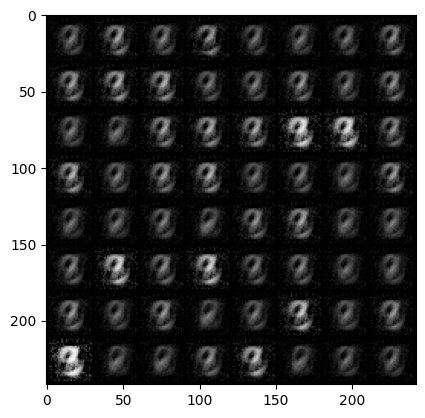

Epoch [5/80] Batch 0/938             Loss D: 0.4584, Loss G: 1.7014
Epoch [5/80] Batch 100/938             Loss D: 0.2370, Loss G: 4.0593
Epoch [5/80] Batch 200/938             Loss D: 0.3857, Loss G: 3.4015
Epoch [5/80] Batch 300/938             Loss D: 0.5841, Loss G: 3.2600
Epoch [5/80] Batch 400/938             Loss D: 0.3707, Loss G: 2.2292
Epoch [5/80] Batch 500/938             Loss D: 0.1983, Loss G: 4.0242
Epoch [5/80] Batch 600/938             Loss D: 0.4195, Loss G: 5.5979
Epoch [5/80] Batch 700/938             Loss D: 0.5810, Loss G: 2.4281
Epoch [5/80] Batch 800/938             Loss D: 0.1637, Loss G: 4.3860
Epoch [5/80] Batch 900/938             Loss D: 0.1449, Loss G: 3.7885


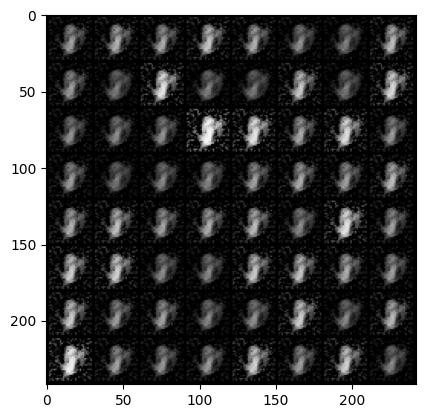

Epoch [6/80] Batch 0/938             Loss D: 0.3356, Loss G: 2.9205
Epoch [6/80] Batch 100/938             Loss D: 0.9507, Loss G: 5.7797
Epoch [6/80] Batch 200/938             Loss D: 0.3894, Loss G: 3.2037
Epoch [6/80] Batch 300/938             Loss D: 0.3246, Loss G: 4.2341
Epoch [6/80] Batch 400/938             Loss D: 0.7323, Loss G: 2.2485
Epoch [6/80] Batch 500/938             Loss D: 0.7111, Loss G: 2.7564
Epoch [6/80] Batch 600/938             Loss D: 0.0575, Loss G: 5.0268
Epoch [6/80] Batch 700/938             Loss D: 0.5908, Loss G: 2.1966
Epoch [6/80] Batch 800/938             Loss D: 0.2719, Loss G: 3.1715
Epoch [6/80] Batch 900/938             Loss D: 0.1641, Loss G: 4.8904


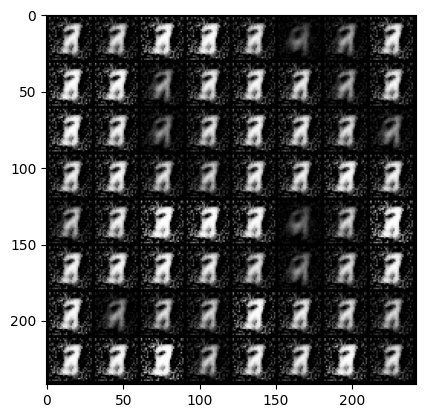

Epoch [7/80] Batch 0/938             Loss D: 1.2286, Loss G: 5.8489
Epoch [7/80] Batch 100/938             Loss D: 0.3201, Loss G: 2.8679
Epoch [7/80] Batch 200/938             Loss D: 0.4941, Loss G: 2.4610
Epoch [7/80] Batch 300/938             Loss D: 0.6286, Loss G: 1.5507
Epoch [7/80] Batch 400/938             Loss D: 0.4547, Loss G: 3.2291
Epoch [7/80] Batch 500/938             Loss D: 0.7920, Loss G: 5.9916
Epoch [7/80] Batch 600/938             Loss D: 0.2644, Loss G: 3.9391
Epoch [7/80] Batch 700/938             Loss D: 0.7096, Loss G: 3.3902
Epoch [7/80] Batch 800/938             Loss D: 0.8681, Loss G: 3.2172
Epoch [7/80] Batch 900/938             Loss D: 0.5496, Loss G: 4.7429


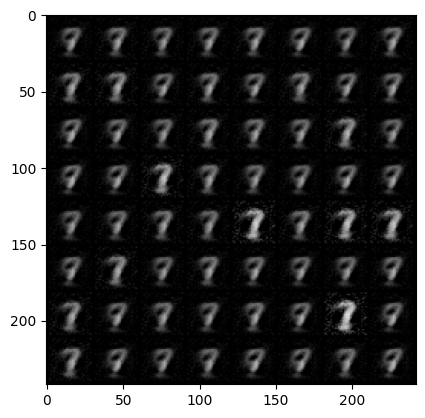

Epoch [8/80] Batch 0/938             Loss D: 0.5766, Loss G: 2.3408
Epoch [8/80] Batch 100/938             Loss D: 0.3949, Loss G: 3.6380
Epoch [8/80] Batch 200/938             Loss D: 0.6137, Loss G: 2.3416
Epoch [8/80] Batch 300/938             Loss D: 0.5364, Loss G: 2.1569
Epoch [8/80] Batch 400/938             Loss D: 0.2467, Loss G: 3.6752
Epoch [8/80] Batch 500/938             Loss D: 0.2802, Loss G: 3.4036
Epoch [8/80] Batch 600/938             Loss D: 0.1951, Loss G: 4.0815
Epoch [8/80] Batch 700/938             Loss D: 0.3540, Loss G: 1.9818
Epoch [8/80] Batch 800/938             Loss D: 0.1399, Loss G: 3.9100
Epoch [8/80] Batch 900/938             Loss D: 0.3435, Loss G: 2.0066


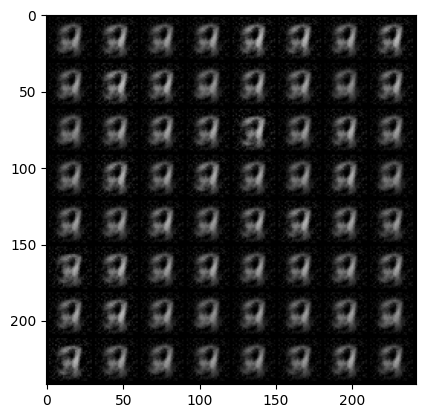

Epoch [9/80] Batch 0/938             Loss D: 0.3953, Loss G: 2.0250
Epoch [9/80] Batch 100/938             Loss D: 0.6683, Loss G: 2.9204
Epoch [9/80] Batch 200/938             Loss D: 0.1807, Loss G: 7.1331
Epoch [9/80] Batch 300/938             Loss D: 0.7704, Loss G: 1.6336
Epoch [9/80] Batch 400/938             Loss D: 0.3497, Loss G: 2.5214
Epoch [9/80] Batch 500/938             Loss D: 0.2909, Loss G: 2.9826
Epoch [9/80] Batch 600/938             Loss D: 0.4083, Loss G: 3.0761
Epoch [9/80] Batch 700/938             Loss D: 0.3775, Loss G: 4.0922
Epoch [9/80] Batch 800/938             Loss D: 0.1569, Loss G: 3.4880
Epoch [9/80] Batch 900/938             Loss D: 1.8300, Loss G: 7.9783


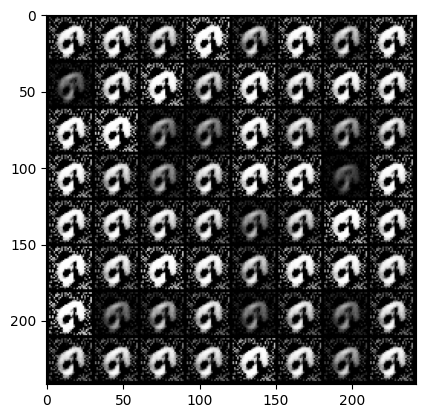

Epoch [10/80] Batch 0/938             Loss D: 0.3168, Loss G: 4.6320
Epoch [10/80] Batch 100/938             Loss D: 0.3136, Loss G: 4.0447
Epoch [10/80] Batch 200/938             Loss D: 0.7685, Loss G: 3.3033
Epoch [10/80] Batch 300/938             Loss D: 0.5819, Loss G: 1.8679
Epoch [10/80] Batch 400/938             Loss D: 0.2654, Loss G: 5.5237
Epoch [10/80] Batch 500/938             Loss D: 0.4725, Loss G: 5.5313
Epoch [10/80] Batch 600/938             Loss D: 0.2614, Loss G: 3.0154
Epoch [10/80] Batch 700/938             Loss D: 0.7321, Loss G: 12.4479
Epoch [10/80] Batch 800/938             Loss D: 0.6237, Loss G: 2.8936
Epoch [10/80] Batch 900/938             Loss D: 0.5278, Loss G: 3.2420


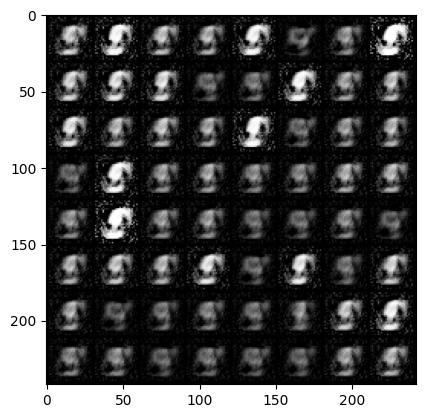

Epoch [11/80] Batch 0/938             Loss D: 0.4786, Loss G: 2.5126
Epoch [11/80] Batch 100/938             Loss D: 0.4025, Loss G: 2.9145
Epoch [11/80] Batch 200/938             Loss D: 0.4519, Loss G: 3.5949
Epoch [11/80] Batch 300/938             Loss D: 0.5763, Loss G: 1.9698
Epoch [11/80] Batch 400/938             Loss D: 0.2457, Loss G: 3.4113
Epoch [11/80] Batch 500/938             Loss D: 0.3647, Loss G: 2.9154
Epoch [11/80] Batch 600/938             Loss D: 0.4121, Loss G: 4.8909
Epoch [11/80] Batch 700/938             Loss D: 0.2479, Loss G: 3.3225
Epoch [11/80] Batch 800/938             Loss D: 0.9186, Loss G: 2.8431
Epoch [11/80] Batch 900/938             Loss D: 0.4662, Loss G: 4.8826


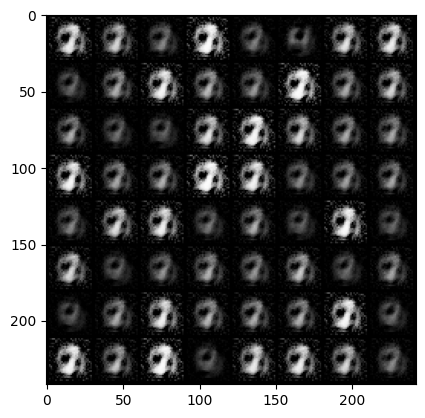

Epoch [12/80] Batch 0/938             Loss D: 0.9219, Loss G: 2.6020
Epoch [12/80] Batch 100/938             Loss D: 0.4234, Loss G: 3.9015
Epoch [12/80] Batch 200/938             Loss D: 0.2812, Loss G: 2.9414
Epoch [12/80] Batch 300/938             Loss D: 0.7742, Loss G: 2.7626
Epoch [12/80] Batch 400/938             Loss D: 0.4192, Loss G: 4.3434
Epoch [12/80] Batch 500/938             Loss D: 0.9476, Loss G: 2.4388
Epoch [12/80] Batch 600/938             Loss D: 0.4844, Loss G: 2.3644
Epoch [12/80] Batch 700/938             Loss D: 0.4958, Loss G: 3.1699
Epoch [12/80] Batch 800/938             Loss D: 0.6314, Loss G: 3.4836
Epoch [12/80] Batch 900/938             Loss D: 0.8196, Loss G: 3.9081


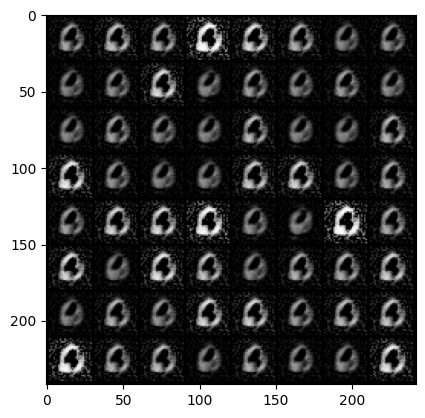

Epoch [13/80] Batch 0/938             Loss D: 0.2057, Loss G: 3.4475
Epoch [13/80] Batch 100/938             Loss D: 0.4775, Loss G: 4.1427
Epoch [13/80] Batch 200/938             Loss D: 0.8459, Loss G: 2.4741
Epoch [13/80] Batch 300/938             Loss D: 0.2867, Loss G: 2.3821
Epoch [13/80] Batch 400/938             Loss D: 0.2787, Loss G: 4.6265
Epoch [13/80] Batch 500/938             Loss D: 0.2821, Loss G: 5.3631
Epoch [13/80] Batch 600/938             Loss D: 0.5336, Loss G: 2.4548
Epoch [13/80] Batch 700/938             Loss D: 0.4110, Loss G: 5.0345
Epoch [13/80] Batch 800/938             Loss D: 0.3069, Loss G: 2.5560
Epoch [13/80] Batch 900/938             Loss D: 0.3979, Loss G: 3.4431


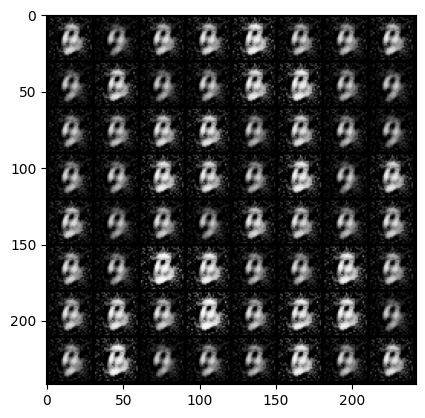

Epoch [14/80] Batch 0/938             Loss D: 0.5514, Loss G: 3.2127
Epoch [14/80] Batch 100/938             Loss D: 0.2157, Loss G: 3.3608
Epoch [14/80] Batch 200/938             Loss D: 0.5430, Loss G: 2.5415
Epoch [14/80] Batch 300/938             Loss D: 0.4147, Loss G: 3.7589
Epoch [14/80] Batch 400/938             Loss D: 0.8435, Loss G: 3.1088
Epoch [14/80] Batch 500/938             Loss D: 0.2410, Loss G: 3.4637
Epoch [14/80] Batch 600/938             Loss D: 0.4040, Loss G: 2.8693
Epoch [14/80] Batch 700/938             Loss D: 0.2362, Loss G: 2.7411
Epoch [14/80] Batch 800/938             Loss D: 0.7177, Loss G: 4.8226
Epoch [14/80] Batch 900/938             Loss D: 0.4219, Loss G: 7.4415


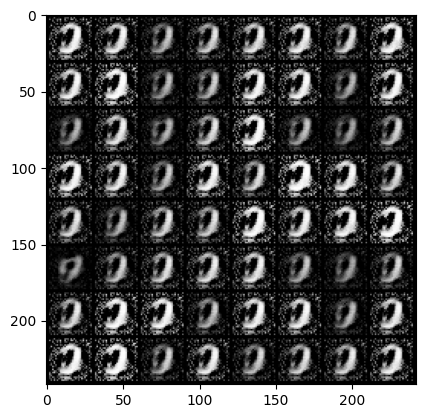

Epoch [15/80] Batch 0/938             Loss D: 0.5493, Loss G: 3.9972
Epoch [15/80] Batch 100/938             Loss D: 1.1331, Loss G: 2.1342
Epoch [15/80] Batch 200/938             Loss D: 0.2541, Loss G: 3.8108
Epoch [15/80] Batch 300/938             Loss D: 0.4287, Loss G: 5.6825
Epoch [15/80] Batch 400/938             Loss D: 0.2597, Loss G: 3.4080
Epoch [15/80] Batch 500/938             Loss D: 1.7202, Loss G: 2.7667
Epoch [15/80] Batch 600/938             Loss D: 0.3432, Loss G: 5.9266
Epoch [15/80] Batch 700/938             Loss D: 0.3267, Loss G: 2.3328
Epoch [15/80] Batch 800/938             Loss D: 0.6163, Loss G: 2.9195
Epoch [15/80] Batch 900/938             Loss D: 0.6571, Loss G: 2.6506


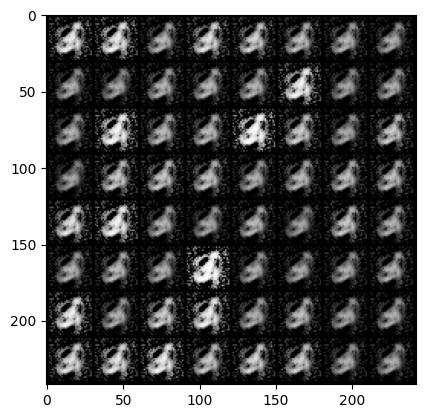

Epoch [16/80] Batch 0/938             Loss D: 0.1869, Loss G: 3.3054
Epoch [16/80] Batch 100/938             Loss D: 1.0345, Loss G: 2.5279
Epoch [16/80] Batch 200/938             Loss D: 1.1778, Loss G: 2.5944
Epoch [16/80] Batch 300/938             Loss D: 0.1827, Loss G: 2.6756
Epoch [16/80] Batch 400/938             Loss D: 1.0516, Loss G: 5.4490
Epoch [16/80] Batch 500/938             Loss D: 0.3856, Loss G: 1.7078
Epoch [16/80] Batch 600/938             Loss D: 0.4746, Loss G: 3.1216
Epoch [16/80] Batch 700/938             Loss D: 0.4392, Loss G: 4.0229
Epoch [16/80] Batch 800/938             Loss D: 0.3704, Loss G: 3.7195
Epoch [16/80] Batch 900/938             Loss D: 1.0583, Loss G: 7.8097


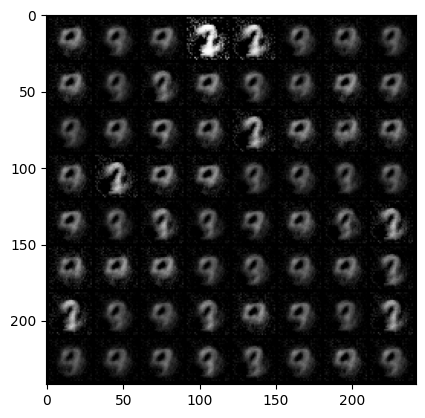

Epoch [17/80] Batch 0/938             Loss D: 0.5049, Loss G: 2.0540
Epoch [17/80] Batch 100/938             Loss D: 0.2480, Loss G: 4.0786
Epoch [17/80] Batch 200/938             Loss D: 0.3564, Loss G: 5.6434
Epoch [17/80] Batch 300/938             Loss D: 0.5730, Loss G: 2.9610
Epoch [17/80] Batch 400/938             Loss D: 0.4975, Loss G: 3.4621
Epoch [17/80] Batch 500/938             Loss D: 0.5854, Loss G: 7.3617
Epoch [17/80] Batch 600/938             Loss D: 0.3258, Loss G: 2.7916
Epoch [17/80] Batch 700/938             Loss D: 0.6630, Loss G: 2.8771
Epoch [17/80] Batch 800/938             Loss D: 1.3997, Loss G: 5.0909
Epoch [17/80] Batch 900/938             Loss D: 0.7046, Loss G: 1.8352


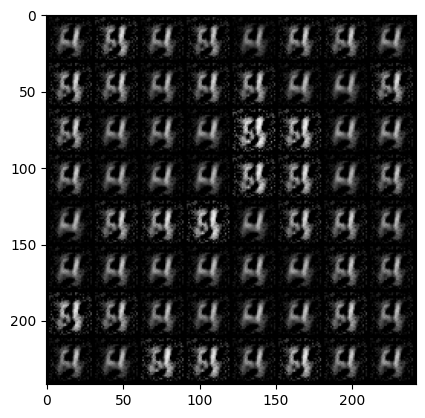

Epoch [18/80] Batch 0/938             Loss D: 0.2810, Loss G: 4.1849
Epoch [18/80] Batch 100/938             Loss D: 1.0262, Loss G: 2.1970
Epoch [18/80] Batch 200/938             Loss D: 0.1481, Loss G: 4.9803
Epoch [18/80] Batch 300/938             Loss D: 1.0812, Loss G: 2.7361
Epoch [18/80] Batch 400/938             Loss D: 0.3428, Loss G: 3.1214
Epoch [18/80] Batch 500/938             Loss D: 0.2714, Loss G: 3.0800
Epoch [18/80] Batch 600/938             Loss D: 0.4734, Loss G: 2.9391
Epoch [18/80] Batch 700/938             Loss D: 0.4145, Loss G: 7.2870
Epoch [18/80] Batch 800/938             Loss D: 0.6032, Loss G: 2.4551
Epoch [18/80] Batch 900/938             Loss D: 0.5742, Loss G: 3.3419


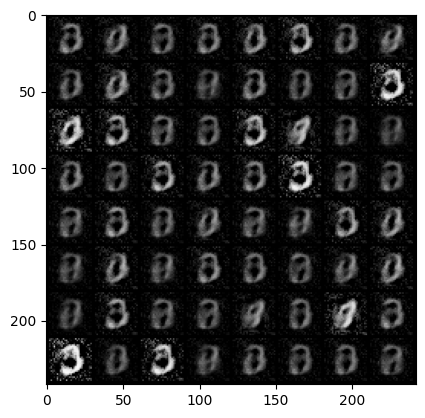

Epoch [19/80] Batch 0/938             Loss D: 0.4230, Loss G: 2.7892
Epoch [19/80] Batch 100/938             Loss D: 0.9874, Loss G: 3.7093
Epoch [19/80] Batch 200/938             Loss D: 0.1683, Loss G: 5.0760
Epoch [19/80] Batch 300/938             Loss D: 0.1061, Loss G: 3.9224
Epoch [19/80] Batch 400/938             Loss D: 0.6183, Loss G: 3.0202
Epoch [19/80] Batch 500/938             Loss D: 0.2044, Loss G: 2.9284
Epoch [19/80] Batch 600/938             Loss D: 0.4739, Loss G: 3.1143
Epoch [19/80] Batch 700/938             Loss D: 0.7412, Loss G: 3.6100
Epoch [19/80] Batch 800/938             Loss D: 0.2917, Loss G: 4.5536
Epoch [19/80] Batch 900/938             Loss D: 0.5651, Loss G: 3.3991


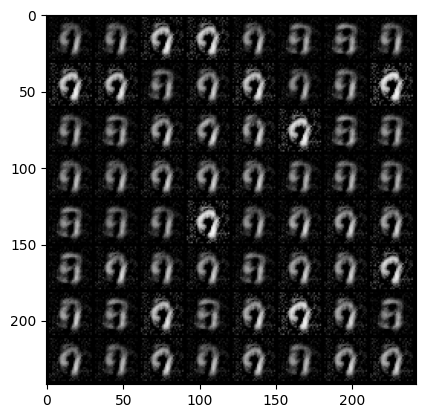

Epoch [20/80] Batch 0/938             Loss D: 0.8093, Loss G: 3.4553
Epoch [20/80] Batch 100/938             Loss D: 0.3948, Loss G: 2.6027
Epoch [20/80] Batch 200/938             Loss D: 0.3480, Loss G: 5.6790
Epoch [20/80] Batch 300/938             Loss D: 0.2373, Loss G: 3.9556
Epoch [20/80] Batch 400/938             Loss D: 0.9189, Loss G: 2.8947
Epoch [20/80] Batch 500/938             Loss D: 0.6076, Loss G: 2.5780
Epoch [20/80] Batch 600/938             Loss D: 0.2295, Loss G: 2.9624
Epoch [20/80] Batch 700/938             Loss D: 0.5637, Loss G: 5.1400
Epoch [20/80] Batch 800/938             Loss D: 0.5336, Loss G: 2.3635
Epoch [20/80] Batch 900/938             Loss D: 0.5104, Loss G: 3.6161


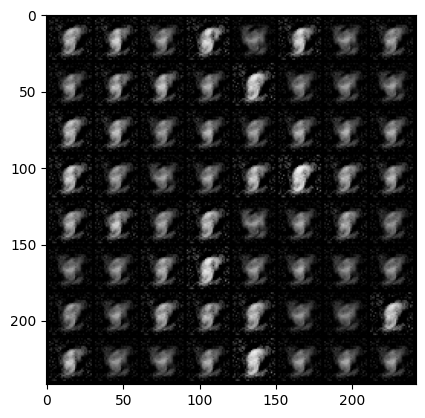

Epoch [21/80] Batch 0/938             Loss D: 0.4241, Loss G: 3.8999
Epoch [21/80] Batch 100/938             Loss D: 0.1296, Loss G: 5.3035
Epoch [21/80] Batch 200/938             Loss D: 0.3774, Loss G: 2.9332
Epoch [21/80] Batch 300/938             Loss D: 0.5217, Loss G: 2.5115
Epoch [21/80] Batch 400/938             Loss D: 0.5503, Loss G: 5.3045
Epoch [21/80] Batch 500/938             Loss D: 0.5156, Loss G: 2.5542
Epoch [21/80] Batch 600/938             Loss D: 0.1900, Loss G: 2.8739
Epoch [21/80] Batch 700/938             Loss D: 1.3618, Loss G: 5.2943
Epoch [21/80] Batch 800/938             Loss D: 0.4371, Loss G: 4.9453
Epoch [21/80] Batch 900/938             Loss D: 0.4846, Loss G: 4.3053


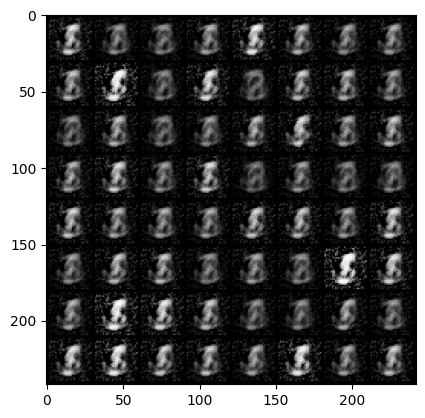

Epoch [22/80] Batch 0/938             Loss D: 0.7428, Loss G: 2.1071
Epoch [22/80] Batch 100/938             Loss D: 0.2395, Loss G: 4.4456
Epoch [22/80] Batch 200/938             Loss D: 0.7447, Loss G: 3.5735
Epoch [22/80] Batch 300/938             Loss D: 1.1978, Loss G: 3.6954
Epoch [22/80] Batch 400/938             Loss D: 0.3327, Loss G: 4.1039
Epoch [22/80] Batch 500/938             Loss D: 0.5899, Loss G: 4.7838
Epoch [22/80] Batch 600/938             Loss D: 1.0202, Loss G: 1.7119
Epoch [22/80] Batch 700/938             Loss D: 0.3393, Loss G: 3.9700
Epoch [22/80] Batch 800/938             Loss D: 0.1537, Loss G: 4.7347
Epoch [22/80] Batch 900/938             Loss D: 0.4295, Loss G: 3.2394


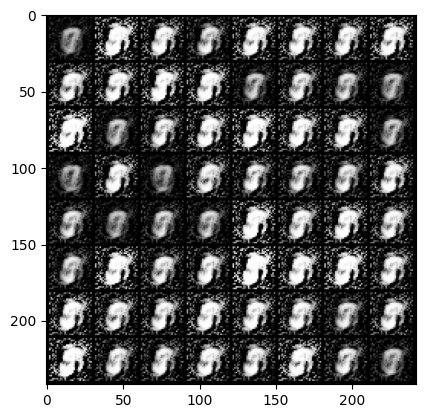

Epoch [23/80] Batch 0/938             Loss D: 0.6025, Loss G: 5.3058
Epoch [23/80] Batch 100/938             Loss D: 0.3597, Loss G: 3.4944
Epoch [23/80] Batch 200/938             Loss D: 2.0545, Loss G: 4.6171
Epoch [23/80] Batch 300/938             Loss D: 0.5137, Loss G: 2.5003
Epoch [23/80] Batch 400/938             Loss D: 0.2377, Loss G: 3.0304
Epoch [23/80] Batch 500/938             Loss D: 0.5808, Loss G: 5.9310
Epoch [23/80] Batch 600/938             Loss D: 0.7611, Loss G: 3.1644
Epoch [23/80] Batch 700/938             Loss D: 0.6280, Loss G: 2.9669
Epoch [23/80] Batch 800/938             Loss D: 0.5649, Loss G: 4.9573
Epoch [23/80] Batch 900/938             Loss D: 0.7020, Loss G: 3.1036


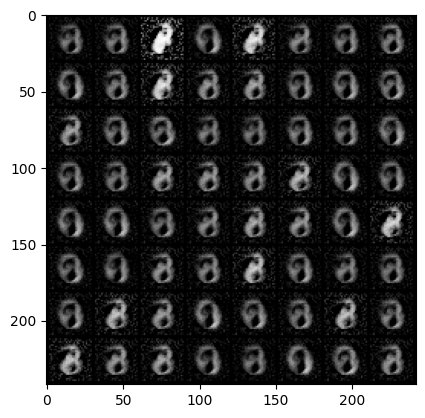

Epoch [24/80] Batch 0/938             Loss D: 0.2180, Loss G: 2.9075
Epoch [24/80] Batch 100/938             Loss D: 0.3500, Loss G: 8.1562
Epoch [24/80] Batch 200/938             Loss D: 0.4110, Loss G: 3.7406
Epoch [24/80] Batch 300/938             Loss D: 0.2571, Loss G: 3.1166
Epoch [24/80] Batch 400/938             Loss D: 0.8570, Loss G: 5.8120
Epoch [24/80] Batch 500/938             Loss D: 0.5681, Loss G: 3.7301
Epoch [24/80] Batch 600/938             Loss D: 0.6800, Loss G: 2.4983
Epoch [24/80] Batch 700/938             Loss D: 0.6056, Loss G: 3.9688
Epoch [24/80] Batch 800/938             Loss D: 0.5584, Loss G: 3.4396
Epoch [24/80] Batch 900/938             Loss D: 0.2171, Loss G: 3.3093


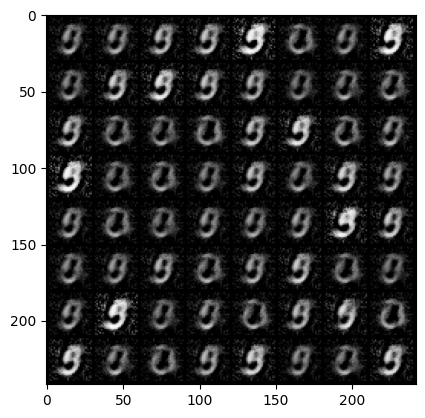

Epoch [25/80] Batch 0/938             Loss D: 0.5684, Loss G: 3.8102
Epoch [25/80] Batch 100/938             Loss D: 0.3779, Loss G: 3.3081
Epoch [25/80] Batch 200/938             Loss D: 0.4298, Loss G: 7.6196
Epoch [25/80] Batch 300/938             Loss D: 0.0999, Loss G: 4.1667
Epoch [25/80] Batch 400/938             Loss D: 0.3147, Loss G: 3.3627
Epoch [25/80] Batch 500/938             Loss D: 0.3145, Loss G: 4.7088
Epoch [25/80] Batch 600/938             Loss D: 0.2672, Loss G: 3.7551
Epoch [25/80] Batch 700/938             Loss D: 0.4395, Loss G: 4.2871
Epoch [25/80] Batch 800/938             Loss D: 0.3441, Loss G: 3.8764
Epoch [25/80] Batch 900/938             Loss D: 0.5271, Loss G: 4.3847


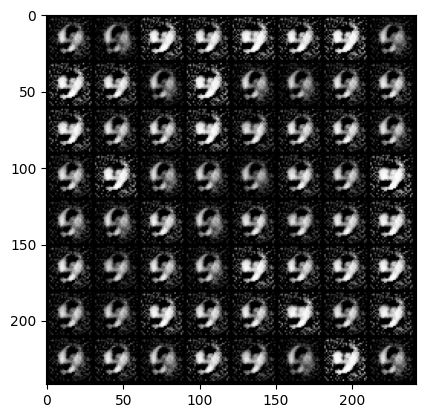

Epoch [26/80] Batch 0/938             Loss D: 0.1756, Loss G: 4.6402
Epoch [26/80] Batch 100/938             Loss D: 0.8978, Loss G: 2.2876
Epoch [26/80] Batch 200/938             Loss D: 0.3456, Loss G: 2.6490
Epoch [26/80] Batch 300/938             Loss D: 0.4488, Loss G: 3.4976
Epoch [26/80] Batch 400/938             Loss D: 0.2716, Loss G: 3.8124
Epoch [26/80] Batch 500/938             Loss D: 0.4829, Loss G: 2.3561
Epoch [26/80] Batch 600/938             Loss D: 0.1113, Loss G: 3.9290
Epoch [26/80] Batch 700/938             Loss D: 0.3139, Loss G: 6.6497
Epoch [26/80] Batch 800/938             Loss D: 0.4357, Loss G: 2.5914
Epoch [26/80] Batch 900/938             Loss D: 0.2962, Loss G: 3.5587


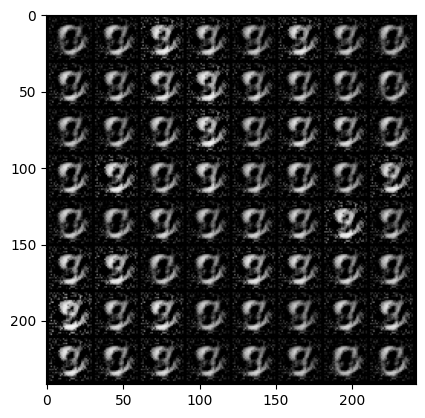

Epoch [27/80] Batch 0/938             Loss D: 0.2854, Loss G: 4.1438
Epoch [27/80] Batch 100/938             Loss D: 0.4529, Loss G: 3.8461
Epoch [27/80] Batch 200/938             Loss D: 0.4115, Loss G: 3.4142
Epoch [27/80] Batch 300/938             Loss D: 0.8639, Loss G: 4.2562
Epoch [27/80] Batch 400/938             Loss D: 0.3155, Loss G: 3.3640
Epoch [27/80] Batch 500/938             Loss D: 0.3547, Loss G: 2.5705
Epoch [27/80] Batch 600/938             Loss D: 0.1043, Loss G: 6.0777
Epoch [27/80] Batch 700/938             Loss D: 0.4705, Loss G: 2.4018
Epoch [27/80] Batch 800/938             Loss D: 0.5328, Loss G: 2.6526
Epoch [27/80] Batch 900/938             Loss D: 0.1834, Loss G: 4.6829


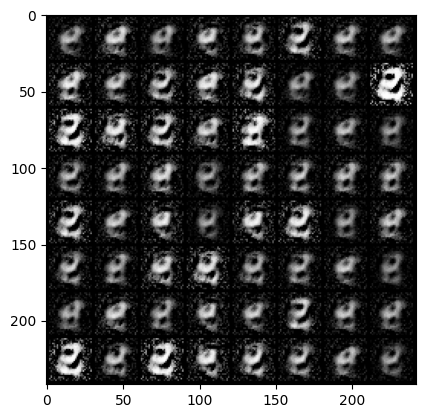

Epoch [28/80] Batch 0/938             Loss D: 0.5273, Loss G: 3.9540
Epoch [28/80] Batch 100/938             Loss D: 0.3357, Loss G: 5.1982
Epoch [28/80] Batch 200/938             Loss D: 0.8516, Loss G: 2.5780
Epoch [28/80] Batch 300/938             Loss D: 0.4886, Loss G: 3.5102
Epoch [28/80] Batch 400/938             Loss D: 0.6045, Loss G: 3.9411
Epoch [28/80] Batch 500/938             Loss D: 0.7032, Loss G: 2.2778
Epoch [28/80] Batch 600/938             Loss D: 0.3425, Loss G: 4.1367
Epoch [28/80] Batch 700/938             Loss D: 0.2430, Loss G: 5.4835
Epoch [28/80] Batch 800/938             Loss D: 0.6322, Loss G: 3.6339
Epoch [28/80] Batch 900/938             Loss D: 0.1511, Loss G: 3.7001


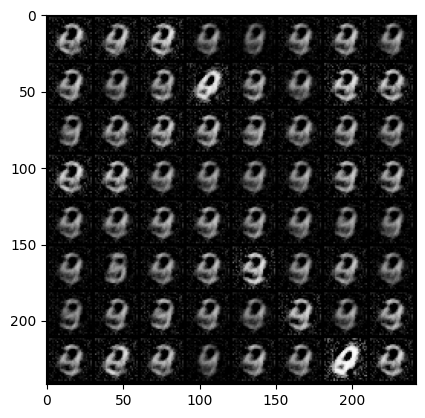

Epoch [29/80] Batch 0/938             Loss D: 0.1875, Loss G: 4.2107
Epoch [29/80] Batch 100/938             Loss D: 0.5879, Loss G: 7.3533
Epoch [29/80] Batch 200/938             Loss D: 0.5243, Loss G: 3.4337
Epoch [29/80] Batch 300/938             Loss D: 0.2740, Loss G: 4.3257
Epoch [29/80] Batch 400/938             Loss D: 0.6313, Loss G: 4.5942
Epoch [29/80] Batch 500/938             Loss D: 0.4518, Loss G: 3.5968
Epoch [29/80] Batch 600/938             Loss D: 0.3221, Loss G: 2.7255
Epoch [29/80] Batch 700/938             Loss D: 0.3918, Loss G: 4.2113
Epoch [29/80] Batch 800/938             Loss D: 0.4656, Loss G: 3.4024
Epoch [29/80] Batch 900/938             Loss D: 0.2026, Loss G: 3.8983


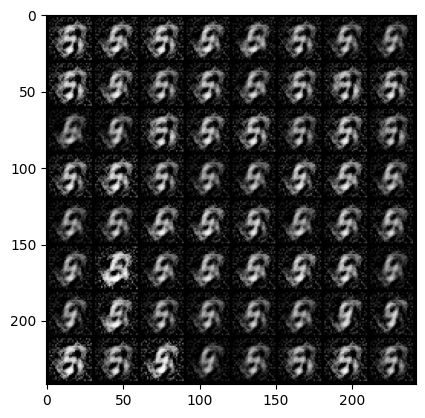

Epoch [30/80] Batch 0/938             Loss D: 0.4673, Loss G: 3.4529
Epoch [30/80] Batch 100/938             Loss D: 0.7195, Loss G: 2.4565
Epoch [30/80] Batch 200/938             Loss D: 0.1434, Loss G: 4.3450
Epoch [30/80] Batch 300/938             Loss D: 0.6791, Loss G: 3.6021
Epoch [30/80] Batch 400/938             Loss D: 0.9810, Loss G: 6.0446
Epoch [30/80] Batch 500/938             Loss D: 0.8641, Loss G: 3.4858
Epoch [30/80] Batch 600/938             Loss D: 0.7568, Loss G: 4.0196
Epoch [30/80] Batch 700/938             Loss D: 0.3191, Loss G: 3.6684
Epoch [30/80] Batch 800/938             Loss D: 0.1220, Loss G: 4.7830
Epoch [30/80] Batch 900/938             Loss D: 0.4697, Loss G: 5.8885


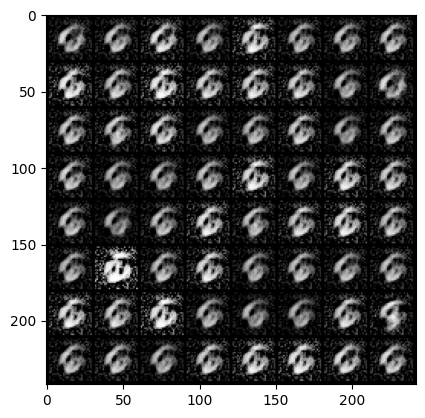

Epoch [31/80] Batch 0/938             Loss D: 1.1083, Loss G: 4.0088
Epoch [31/80] Batch 100/938             Loss D: 0.2869, Loss G: 3.3108
Epoch [31/80] Batch 200/938             Loss D: 0.3949, Loss G: 4.1372
Epoch [31/80] Batch 300/938             Loss D: 0.4840, Loss G: 4.5747
Epoch [31/80] Batch 400/938             Loss D: 1.1656, Loss G: 2.8905
Epoch [31/80] Batch 500/938             Loss D: 0.4039, Loss G: 3.9317
Epoch [31/80] Batch 600/938             Loss D: 0.3240, Loss G: 4.8969
Epoch [31/80] Batch 700/938             Loss D: 0.1137, Loss G: 3.4547
Epoch [31/80] Batch 800/938             Loss D: 0.3336, Loss G: 4.5247
Epoch [31/80] Batch 900/938             Loss D: 0.3572, Loss G: 3.6632


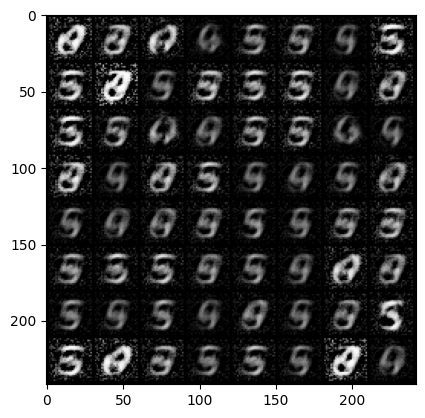

Epoch [32/80] Batch 0/938             Loss D: 0.5041, Loss G: 2.6922
Epoch [32/80] Batch 100/938             Loss D: 0.1530, Loss G: 4.7149
Epoch [32/80] Batch 200/938             Loss D: 0.2813, Loss G: 5.3471
Epoch [32/80] Batch 300/938             Loss D: 0.1812, Loss G: 3.3883
Epoch [32/80] Batch 400/938             Loss D: 0.1223, Loss G: 3.7170
Epoch [32/80] Batch 500/938             Loss D: 0.3133, Loss G: 4.8099
Epoch [32/80] Batch 600/938             Loss D: 0.5202, Loss G: 4.5525
Epoch [32/80] Batch 700/938             Loss D: 0.1689, Loss G: 3.8602
Epoch [32/80] Batch 800/938             Loss D: 0.4060, Loss G: 7.3045
Epoch [32/80] Batch 900/938             Loss D: 0.5265, Loss G: 4.1302


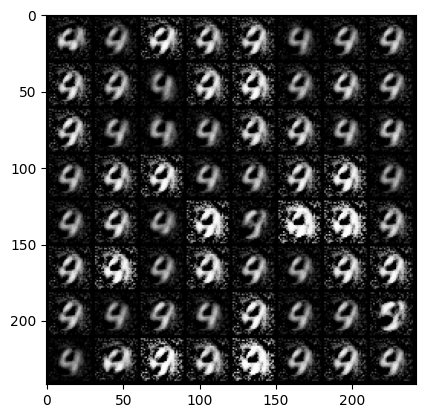

Epoch [33/80] Batch 0/938             Loss D: 0.4495, Loss G: 3.3438
Epoch [33/80] Batch 100/938             Loss D: 0.3099, Loss G: 3.6490
Epoch [33/80] Batch 200/938             Loss D: 0.2691, Loss G: 3.5520
Epoch [33/80] Batch 300/938             Loss D: 0.8300, Loss G: 3.0265
Epoch [33/80] Batch 400/938             Loss D: 0.3565, Loss G: 3.2474
Epoch [33/80] Batch 500/938             Loss D: 0.2205, Loss G: 3.8737
Epoch [33/80] Batch 600/938             Loss D: 0.5323, Loss G: 4.0548
Epoch [33/80] Batch 700/938             Loss D: 0.3176, Loss G: 3.9914
Epoch [33/80] Batch 800/938             Loss D: 0.4304, Loss G: 2.9860
Epoch [33/80] Batch 900/938             Loss D: 0.2127, Loss G: 5.6945


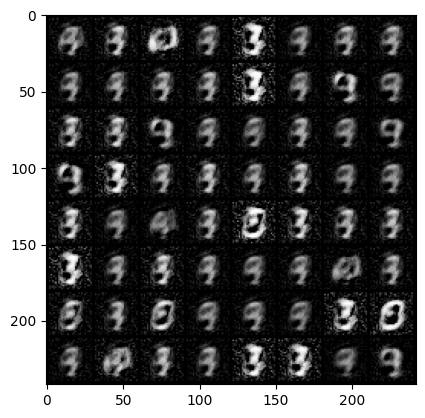

Epoch [34/80] Batch 0/938             Loss D: 0.4323, Loss G: 3.9288
Epoch [34/80] Batch 100/938             Loss D: 0.2173, Loss G: 4.7102
Epoch [34/80] Batch 200/938             Loss D: 0.1866, Loss G: 4.8343
Epoch [34/80] Batch 300/938             Loss D: 0.2017, Loss G: 5.8282
Epoch [34/80] Batch 400/938             Loss D: 0.4628, Loss G: 3.6652
Epoch [34/80] Batch 500/938             Loss D: 0.2689, Loss G: 4.8131
Epoch [34/80] Batch 600/938             Loss D: 0.2605, Loss G: 4.0668
Epoch [34/80] Batch 700/938             Loss D: 0.3115, Loss G: 3.7899
Epoch [34/80] Batch 800/938             Loss D: 0.4572, Loss G: 2.8468
Epoch [34/80] Batch 900/938             Loss D: 0.3030, Loss G: 3.5749


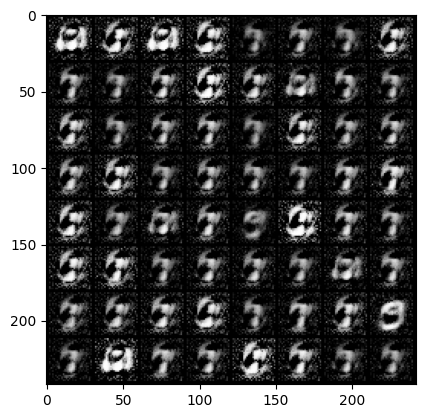

Epoch [35/80] Batch 0/938             Loss D: 0.4738, Loss G: 5.0373
Epoch [35/80] Batch 100/938             Loss D: 0.0944, Loss G: 4.3324
Epoch [35/80] Batch 200/938             Loss D: 0.3974, Loss G: 3.6846
Epoch [35/80] Batch 300/938             Loss D: 0.1561, Loss G: 4.8400
Epoch [35/80] Batch 400/938             Loss D: 0.2502, Loss G: 6.3074
Epoch [35/80] Batch 500/938             Loss D: 0.1626, Loss G: 5.1270
Epoch [35/80] Batch 600/938             Loss D: 0.4726, Loss G: 3.1373
Epoch [35/80] Batch 700/938             Loss D: 0.2204, Loss G: 7.5672
Epoch [35/80] Batch 800/938             Loss D: 0.8691, Loss G: 2.3391
Epoch [35/80] Batch 900/938             Loss D: 0.4039, Loss G: 3.1767


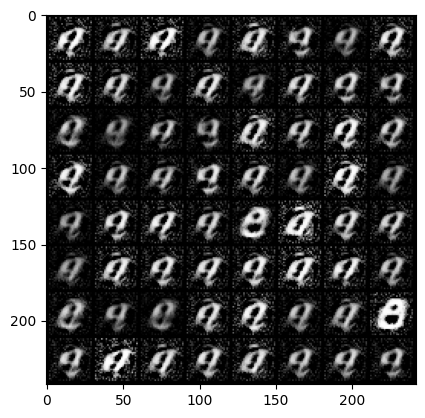

Epoch [36/80] Batch 0/938             Loss D: 0.3704, Loss G: 4.8403
Epoch [36/80] Batch 100/938             Loss D: 0.3858, Loss G: 2.5864
Epoch [36/80] Batch 200/938             Loss D: 0.2306, Loss G: 3.4590
Epoch [36/80] Batch 300/938             Loss D: 0.1028, Loss G: 4.6283
Epoch [36/80] Batch 400/938             Loss D: 0.4518, Loss G: 4.9420
Epoch [36/80] Batch 500/938             Loss D: 0.1048, Loss G: 5.5859
Epoch [36/80] Batch 600/938             Loss D: 0.2876, Loss G: 3.4861
Epoch [36/80] Batch 700/938             Loss D: 0.1129, Loss G: 6.6876
Epoch [36/80] Batch 800/938             Loss D: 0.1666, Loss G: 5.3306
Epoch [36/80] Batch 900/938             Loss D: 0.3349, Loss G: 3.8605


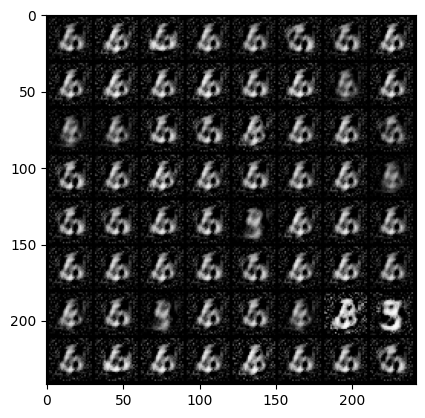

Epoch [37/80] Batch 0/938             Loss D: 0.1808, Loss G: 4.0911
Epoch [37/80] Batch 100/938             Loss D: 0.2295, Loss G: 5.8522
Epoch [37/80] Batch 200/938             Loss D: 0.3299, Loss G: 4.2728
Epoch [37/80] Batch 300/938             Loss D: 0.2785, Loss G: 4.1233
Epoch [37/80] Batch 400/938             Loss D: 0.1173, Loss G: 5.2395
Epoch [37/80] Batch 500/938             Loss D: 0.4048, Loss G: 4.3479
Epoch [37/80] Batch 600/938             Loss D: 0.1533, Loss G: 3.9105
Epoch [37/80] Batch 700/938             Loss D: 0.4315, Loss G: 6.0193
Epoch [37/80] Batch 800/938             Loss D: 0.3939, Loss G: 3.2559
Epoch [37/80] Batch 900/938             Loss D: 0.2595, Loss G: 4.6035


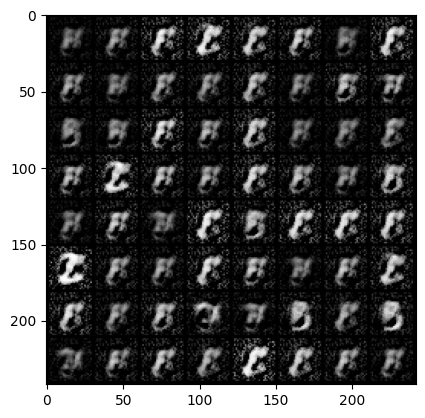

Epoch [38/80] Batch 0/938             Loss D: 0.2239, Loss G: 5.2913
Epoch [38/80] Batch 100/938             Loss D: 0.1815, Loss G: 3.5020
Epoch [38/80] Batch 200/938             Loss D: 0.3063, Loss G: 2.9921
Epoch [38/80] Batch 300/938             Loss D: 0.2609, Loss G: 4.8659
Epoch [38/80] Batch 400/938             Loss D: 0.2144, Loss G: 4.3314
Epoch [38/80] Batch 500/938             Loss D: 0.5991, Loss G: 3.4573
Epoch [38/80] Batch 600/938             Loss D: 0.2088, Loss G: 3.8044
Epoch [38/80] Batch 700/938             Loss D: 0.2571, Loss G: 3.9362
Epoch [38/80] Batch 800/938             Loss D: 0.2786, Loss G: 5.3337
Epoch [38/80] Batch 900/938             Loss D: 0.2306, Loss G: 4.9698


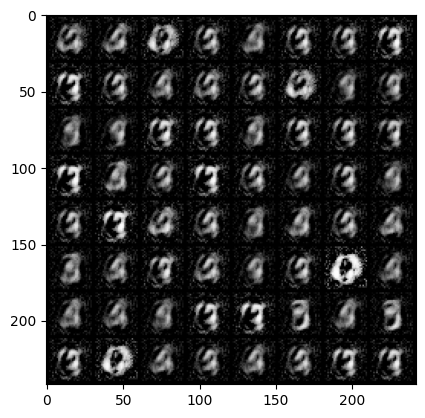

Epoch [39/80] Batch 0/938             Loss D: 0.7236, Loss G: 3.2765
Epoch [39/80] Batch 100/938             Loss D: 0.1629, Loss G: 5.5399
Epoch [39/80] Batch 200/938             Loss D: 0.6026, Loss G: 5.8034
Epoch [39/80] Batch 300/938             Loss D: 0.2756, Loss G: 3.7509
Epoch [39/80] Batch 400/938             Loss D: 0.3302, Loss G: 4.0757
Epoch [39/80] Batch 500/938             Loss D: 0.2915, Loss G: 4.5194
Epoch [39/80] Batch 600/938             Loss D: 0.3811, Loss G: 3.5924
Epoch [39/80] Batch 700/938             Loss D: 0.6585, Loss G: 4.7681
Epoch [39/80] Batch 800/938             Loss D: 0.2477, Loss G: 4.7190
Epoch [39/80] Batch 900/938             Loss D: 0.4206, Loss G: 2.7996


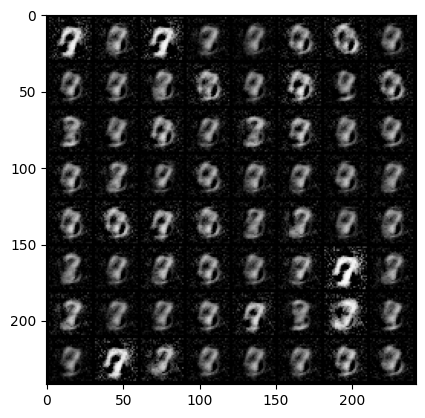

Epoch [40/80] Batch 0/938             Loss D: 0.4019, Loss G: 3.1252
Epoch [40/80] Batch 100/938             Loss D: 0.3814, Loss G: 5.7333
Epoch [40/80] Batch 200/938             Loss D: 0.2579, Loss G: 3.5155
Epoch [40/80] Batch 300/938             Loss D: 0.2152, Loss G: 4.5586
Epoch [40/80] Batch 400/938             Loss D: 0.2792, Loss G: 4.2717
Epoch [40/80] Batch 500/938             Loss D: 0.6507, Loss G: 3.6596
Epoch [40/80] Batch 600/938             Loss D: 0.6002, Loss G: 3.6210
Epoch [40/80] Batch 700/938             Loss D: 0.2771, Loss G: 4.4099
Epoch [40/80] Batch 800/938             Loss D: 0.4376, Loss G: 3.7865
Epoch [40/80] Batch 900/938             Loss D: 0.2506, Loss G: 3.8735


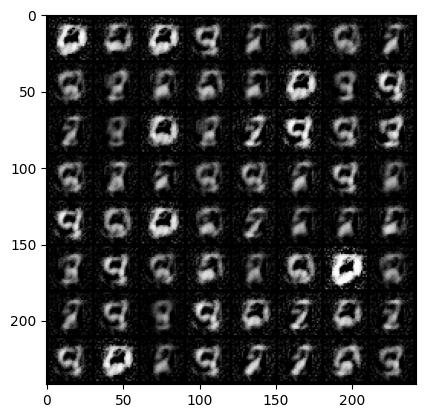

Epoch [41/80] Batch 0/938             Loss D: 0.3360, Loss G: 3.9656
Epoch [41/80] Batch 100/938             Loss D: 0.2206, Loss G: 5.4627
Epoch [41/80] Batch 200/938             Loss D: 0.1429, Loss G: 4.2569
Epoch [41/80] Batch 300/938             Loss D: 0.4244, Loss G: 4.3980
Epoch [41/80] Batch 400/938             Loss D: 0.2356, Loss G: 4.4099
Epoch [41/80] Batch 500/938             Loss D: 0.3078, Loss G: 3.6966
Epoch [41/80] Batch 600/938             Loss D: 0.2320, Loss G: 4.7629
Epoch [41/80] Batch 700/938             Loss D: 0.3099, Loss G: 3.5445
Epoch [41/80] Batch 800/938             Loss D: 0.1088, Loss G: 3.8772
Epoch [41/80] Batch 900/938             Loss D: 0.1408, Loss G: 4.5297


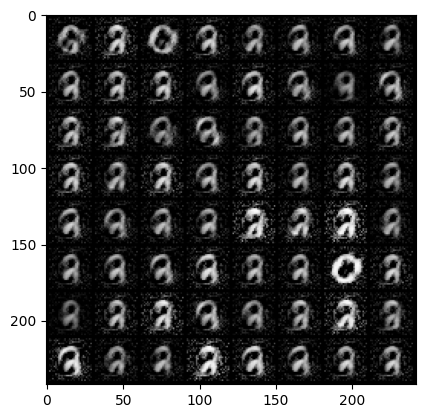

Epoch [42/80] Batch 0/938             Loss D: 0.1898, Loss G: 3.8340
Epoch [42/80] Batch 100/938             Loss D: 0.1990, Loss G: 4.1828
Epoch [42/80] Batch 200/938             Loss D: 0.2991, Loss G: 3.2169
Epoch [42/80] Batch 300/938             Loss D: 0.3916, Loss G: 4.8272
Epoch [42/80] Batch 400/938             Loss D: 0.2535, Loss G: 3.4319
Epoch [42/80] Batch 500/938             Loss D: 0.1711, Loss G: 4.6706
Epoch [42/80] Batch 600/938             Loss D: 0.4237, Loss G: 3.5404
Epoch [42/80] Batch 700/938             Loss D: 0.1281, Loss G: 4.7331
Epoch [42/80] Batch 800/938             Loss D: 0.2740, Loss G: 3.5463
Epoch [42/80] Batch 900/938             Loss D: 0.2278, Loss G: 4.7445


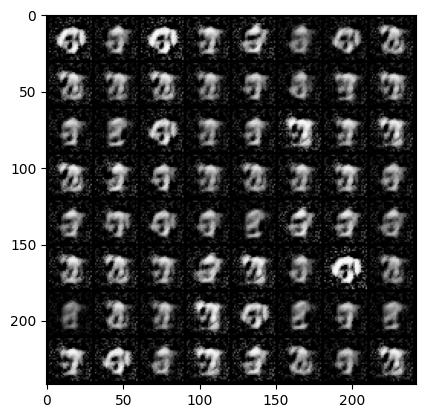

Epoch [43/80] Batch 0/938             Loss D: 0.3533, Loss G: 3.6771
Epoch [43/80] Batch 100/938             Loss D: 0.1281, Loss G: 4.8939
Epoch [43/80] Batch 200/938             Loss D: 0.4979, Loss G: 4.2643
Epoch [43/80] Batch 300/938             Loss D: 0.4375, Loss G: 4.7679
Epoch [43/80] Batch 400/938             Loss D: 0.1252, Loss G: 4.8157
Epoch [43/80] Batch 500/938             Loss D: 0.3863, Loss G: 3.3689
Epoch [43/80] Batch 600/938             Loss D: 0.1835, Loss G: 4.2395
Epoch [43/80] Batch 700/938             Loss D: 0.1302, Loss G: 4.4680
Epoch [43/80] Batch 800/938             Loss D: 0.3824, Loss G: 4.6948
Epoch [43/80] Batch 900/938             Loss D: 0.2415, Loss G: 4.2761


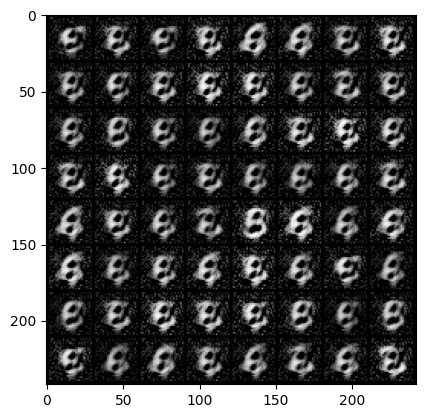

Epoch [44/80] Batch 0/938             Loss D: 0.5798, Loss G: 5.0683
Epoch [44/80] Batch 100/938             Loss D: 0.2766, Loss G: 4.7673
Epoch [44/80] Batch 200/938             Loss D: 0.4190, Loss G: 3.5890
Epoch [44/80] Batch 300/938             Loss D: 0.3044, Loss G: 3.6010
Epoch [44/80] Batch 400/938             Loss D: 0.5302, Loss G: 3.7071
Epoch [44/80] Batch 500/938             Loss D: 0.2208, Loss G: 3.6334
Epoch [44/80] Batch 600/938             Loss D: 0.1049, Loss G: 4.2797
Epoch [44/80] Batch 700/938             Loss D: 0.4489, Loss G: 4.0636
Epoch [44/80] Batch 800/938             Loss D: 0.2417, Loss G: 3.2775
Epoch [44/80] Batch 900/938             Loss D: 0.3682, Loss G: 4.1875


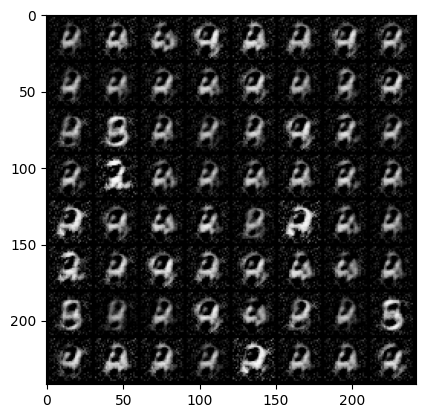

Epoch [45/80] Batch 0/938             Loss D: 0.1626, Loss G: 3.7652
Epoch [45/80] Batch 100/938             Loss D: 0.4928, Loss G: 4.5712
Epoch [45/80] Batch 200/938             Loss D: 0.2074, Loss G: 3.2841
Epoch [45/80] Batch 300/938             Loss D: 0.2249, Loss G: 3.9600
Epoch [45/80] Batch 400/938             Loss D: 0.3936, Loss G: 5.6810
Epoch [45/80] Batch 500/938             Loss D: 0.5118, Loss G: 3.3277
Epoch [45/80] Batch 600/938             Loss D: 0.4387, Loss G: 4.3331
Epoch [45/80] Batch 700/938             Loss D: 0.4435, Loss G: 3.0462
Epoch [45/80] Batch 800/938             Loss D: 0.5238, Loss G: 4.5095
Epoch [45/80] Batch 900/938             Loss D: 0.2446, Loss G: 3.6765


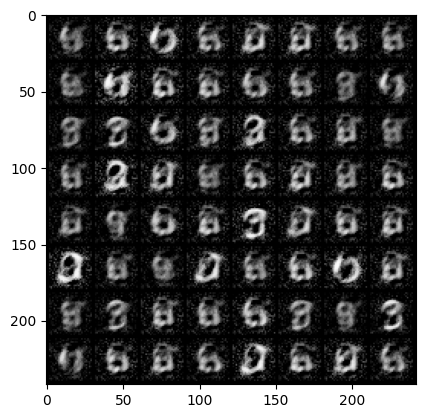

Epoch [46/80] Batch 0/938             Loss D: 0.2692, Loss G: 3.9589
Epoch [46/80] Batch 100/938             Loss D: 0.3817, Loss G: 3.7550
Epoch [46/80] Batch 200/938             Loss D: 0.5383, Loss G: 4.5353
Epoch [46/80] Batch 300/938             Loss D: 0.3656, Loss G: 4.5632
Epoch [46/80] Batch 400/938             Loss D: 0.0595, Loss G: 4.2594
Epoch [46/80] Batch 500/938             Loss D: 0.2615, Loss G: 4.8993
Epoch [46/80] Batch 600/938             Loss D: 0.2131, Loss G: 3.5191
Epoch [46/80] Batch 700/938             Loss D: 0.4020, Loss G: 4.2553
Epoch [46/80] Batch 800/938             Loss D: 0.1878, Loss G: 4.5379
Epoch [46/80] Batch 900/938             Loss D: 0.2531, Loss G: 4.0000


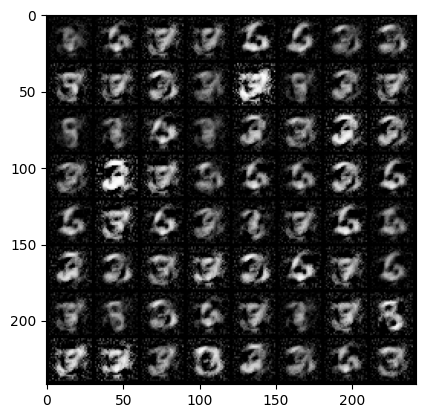

Epoch [47/80] Batch 0/938             Loss D: 0.3395, Loss G: 3.3397
Epoch [47/80] Batch 100/938             Loss D: 0.3545, Loss G: 4.6133
Epoch [47/80] Batch 200/938             Loss D: 0.1133, Loss G: 5.4442
Epoch [47/80] Batch 300/938             Loss D: 0.2633, Loss G: 3.9793
Epoch [47/80] Batch 400/938             Loss D: 0.1706, Loss G: 3.4281
Epoch [47/80] Batch 500/938             Loss D: 0.1372, Loss G: 4.3838
Epoch [47/80] Batch 600/938             Loss D: 0.3477, Loss G: 4.7765
Epoch [47/80] Batch 700/938             Loss D: 0.4092, Loss G: 4.8538
Epoch [47/80] Batch 800/938             Loss D: 0.3966, Loss G: 4.1158
Epoch [47/80] Batch 900/938             Loss D: 0.2530, Loss G: 3.9162


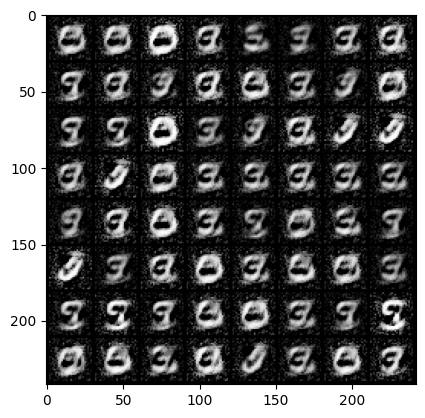

Epoch [48/80] Batch 0/938             Loss D: 0.1138, Loss G: 4.3769
Epoch [48/80] Batch 100/938             Loss D: 0.2891, Loss G: 3.8693
Epoch [48/80] Batch 200/938             Loss D: 0.0717, Loss G: 5.5769
Epoch [48/80] Batch 300/938             Loss D: 0.4459, Loss G: 4.6393
Epoch [48/80] Batch 400/938             Loss D: 0.3385, Loss G: 4.2658
Epoch [48/80] Batch 500/938             Loss D: 0.2575, Loss G: 5.2669
Epoch [48/80] Batch 600/938             Loss D: 0.0882, Loss G: 4.1944
Epoch [48/80] Batch 700/938             Loss D: 0.2340, Loss G: 4.1595
Epoch [48/80] Batch 800/938             Loss D: 0.1146, Loss G: 5.3103
Epoch [48/80] Batch 900/938             Loss D: 0.4891, Loss G: 4.5550


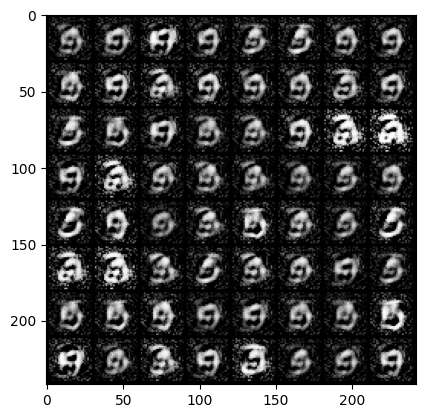

Epoch [49/80] Batch 0/938             Loss D: 0.1930, Loss G: 5.2090
Epoch [49/80] Batch 100/938             Loss D: 0.2289, Loss G: 3.9552
Epoch [49/80] Batch 200/938             Loss D: 0.1315, Loss G: 4.3766
Epoch [49/80] Batch 300/938             Loss D: 0.3149, Loss G: 5.3785
Epoch [49/80] Batch 400/938             Loss D: 0.1153, Loss G: 3.7470
Epoch [49/80] Batch 500/938             Loss D: 0.1632, Loss G: 3.7636
Epoch [49/80] Batch 600/938             Loss D: 0.0926, Loss G: 4.7722
Epoch [49/80] Batch 700/938             Loss D: 0.2391, Loss G: 4.9419
Epoch [49/80] Batch 800/938             Loss D: 0.4533, Loss G: 5.6761
Epoch [49/80] Batch 900/938             Loss D: 0.3487, Loss G: 4.2063


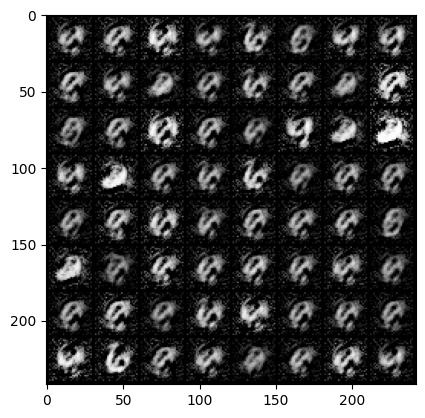

Epoch [50/80] Batch 0/938             Loss D: 0.2307, Loss G: 4.9971
Epoch [50/80] Batch 100/938             Loss D: 0.1736, Loss G: 4.3306
Epoch [50/80] Batch 200/938             Loss D: 0.2268, Loss G: 4.6954
Epoch [50/80] Batch 300/938             Loss D: 0.2596, Loss G: 4.2742
Epoch [50/80] Batch 400/938             Loss D: 0.2095, Loss G: 5.1151
Epoch [50/80] Batch 500/938             Loss D: 0.1244, Loss G: 5.4558
Epoch [50/80] Batch 600/938             Loss D: 0.1365, Loss G: 4.6134
Epoch [50/80] Batch 700/938             Loss D: 0.2192, Loss G: 4.3501
Epoch [50/80] Batch 800/938             Loss D: 0.1528, Loss G: 5.6609
Epoch [50/80] Batch 900/938             Loss D: 0.1795, Loss G: 4.8152


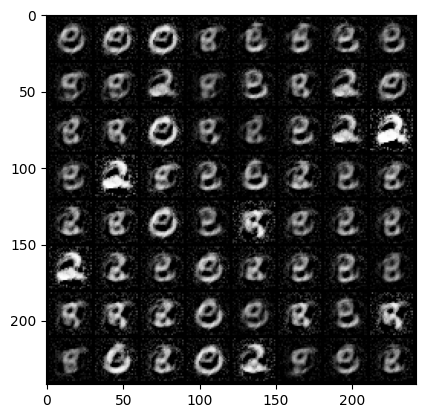

Epoch [51/80] Batch 0/938             Loss D: 0.3433, Loss G: 3.0540
Epoch [51/80] Batch 100/938             Loss D: 0.2093, Loss G: 4.5777
Epoch [51/80] Batch 200/938             Loss D: 0.3141, Loss G: 5.0336
Epoch [51/80] Batch 300/938             Loss D: 0.2564, Loss G: 3.7522
Epoch [51/80] Batch 400/938             Loss D: 0.0833, Loss G: 4.8811
Epoch [51/80] Batch 500/938             Loss D: 0.2016, Loss G: 4.4531
Epoch [51/80] Batch 600/938             Loss D: 0.1956, Loss G: 5.2788
Epoch [51/80] Batch 700/938             Loss D: 0.2781, Loss G: 5.4543
Epoch [51/80] Batch 800/938             Loss D: 0.1481, Loss G: 4.3653
Epoch [51/80] Batch 900/938             Loss D: 0.1969, Loss G: 3.6320


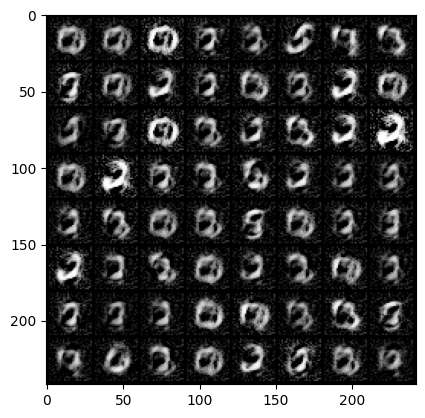

Epoch [52/80] Batch 0/938             Loss D: 0.2167, Loss G: 3.8951
Epoch [52/80] Batch 100/938             Loss D: 0.2620, Loss G: 3.6353
Epoch [52/80] Batch 200/938             Loss D: 0.3415, Loss G: 5.2555
Epoch [52/80] Batch 300/938             Loss D: 0.2861, Loss G: 3.6490
Epoch [52/80] Batch 400/938             Loss D: 0.1575, Loss G: 4.0643
Epoch [52/80] Batch 500/938             Loss D: 0.1719, Loss G: 3.8853
Epoch [52/80] Batch 600/938             Loss D: 0.1630, Loss G: 4.7962
Epoch [52/80] Batch 700/938             Loss D: 0.3847, Loss G: 4.5675
Epoch [52/80] Batch 800/938             Loss D: 0.1186, Loss G: 3.8327
Epoch [52/80] Batch 900/938             Loss D: 0.2617, Loss G: 4.6279


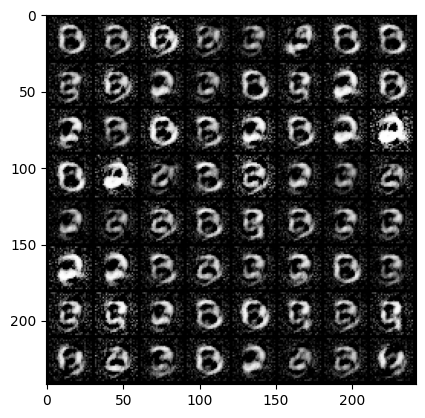

Epoch [53/80] Batch 0/938             Loss D: 0.2943, Loss G: 4.9377
Epoch [53/80] Batch 100/938             Loss D: 0.1672, Loss G: 3.6496
Epoch [53/80] Batch 200/938             Loss D: 0.1172, Loss G: 4.6810
Epoch [53/80] Batch 300/938             Loss D: 0.1384, Loss G: 4.9646
Epoch [53/80] Batch 400/938             Loss D: 0.1850, Loss G: 4.1120
Epoch [53/80] Batch 500/938             Loss D: 0.1631, Loss G: 4.9268
Epoch [53/80] Batch 600/938             Loss D: 0.3584, Loss G: 4.4928
Epoch [53/80] Batch 700/938             Loss D: 0.1320, Loss G: 4.4057
Epoch [53/80] Batch 800/938             Loss D: 0.2159, Loss G: 5.0019
Epoch [53/80] Batch 900/938             Loss D: 0.2913, Loss G: 3.1896


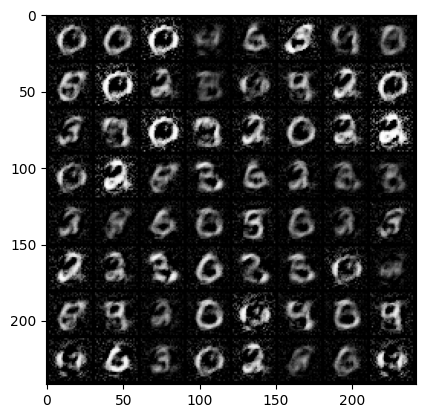

Epoch [54/80] Batch 0/938             Loss D: 0.3572, Loss G: 3.7128
Epoch [54/80] Batch 100/938             Loss D: 0.4926, Loss G: 4.8192
Epoch [54/80] Batch 200/938             Loss D: 0.1738, Loss G: 4.6725
Epoch [54/80] Batch 300/938             Loss D: 0.1652, Loss G: 4.6800
Epoch [54/80] Batch 400/938             Loss D: 0.2636, Loss G: 3.3146
Epoch [54/80] Batch 500/938             Loss D: 0.3573, Loss G: 4.8297
Epoch [54/80] Batch 600/938             Loss D: 0.4190, Loss G: 4.2324
Epoch [54/80] Batch 700/938             Loss D: 0.1940, Loss G: 3.6616
Epoch [54/80] Batch 800/938             Loss D: 0.2164, Loss G: 5.7809
Epoch [54/80] Batch 900/938             Loss D: 0.3570, Loss G: 4.4725


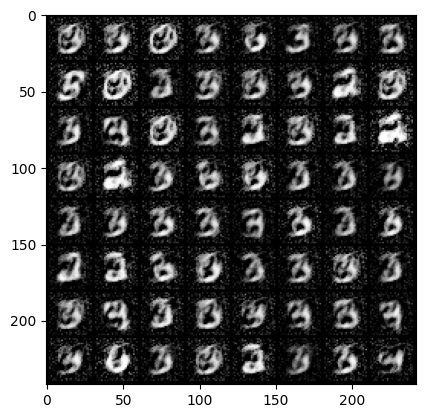

Epoch [55/80] Batch 0/938             Loss D: 0.2726, Loss G: 4.4789
Epoch [55/80] Batch 100/938             Loss D: 0.1562, Loss G: 4.0943
Epoch [55/80] Batch 200/938             Loss D: 0.2564, Loss G: 5.2269
Epoch [55/80] Batch 300/938             Loss D: 0.1565, Loss G: 3.7692
Epoch [55/80] Batch 400/938             Loss D: 0.2968, Loss G: 3.8019
Epoch [55/80] Batch 500/938             Loss D: 0.3131, Loss G: 5.0152
Epoch [55/80] Batch 600/938             Loss D: 0.2992, Loss G: 3.8064
Epoch [55/80] Batch 700/938             Loss D: 0.1992, Loss G: 4.9420
Epoch [55/80] Batch 800/938             Loss D: 0.3863, Loss G: 3.8572
Epoch [55/80] Batch 900/938             Loss D: 0.4276, Loss G: 4.2782


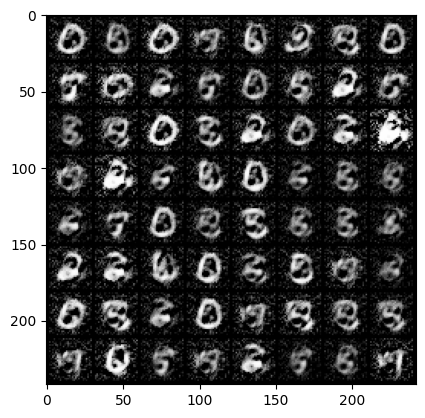

Epoch [56/80] Batch 0/938             Loss D: 0.1986, Loss G: 4.8862
Epoch [56/80] Batch 100/938             Loss D: 0.2538, Loss G: 4.4368
Epoch [56/80] Batch 200/938             Loss D: 0.3871, Loss G: 5.1231
Epoch [56/80] Batch 300/938             Loss D: 0.2298, Loss G: 4.4305
Epoch [56/80] Batch 400/938             Loss D: 0.2020, Loss G: 3.8976
Epoch [56/80] Batch 500/938             Loss D: 0.2811, Loss G: 3.6290
Epoch [56/80] Batch 600/938             Loss D: 0.1706, Loss G: 4.5421
Epoch [56/80] Batch 700/938             Loss D: 0.3516, Loss G: 4.3673
Epoch [56/80] Batch 800/938             Loss D: 0.1450, Loss G: 4.6404
Epoch [56/80] Batch 900/938             Loss D: 0.2627, Loss G: 4.8239


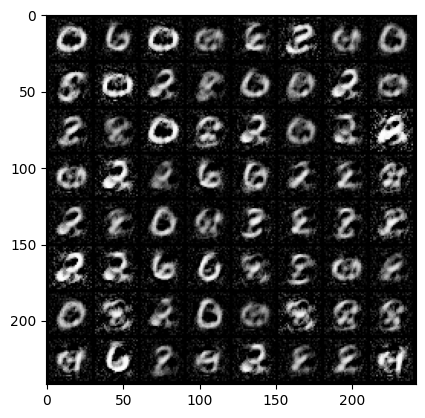

Epoch [57/80] Batch 0/938             Loss D: 0.2941, Loss G: 3.8444
Epoch [57/80] Batch 100/938             Loss D: 0.2516, Loss G: 4.8187
Epoch [57/80] Batch 200/938             Loss D: 0.5646, Loss G: 4.3079
Epoch [57/80] Batch 300/938             Loss D: 0.3638, Loss G: 3.5994
Epoch [57/80] Batch 400/938             Loss D: 0.3205, Loss G: 4.4126
Epoch [57/80] Batch 500/938             Loss D: 0.3720, Loss G: 3.8757
Epoch [57/80] Batch 600/938             Loss D: 0.3483, Loss G: 4.0783
Epoch [57/80] Batch 700/938             Loss D: 0.0845, Loss G: 4.3604
Epoch [57/80] Batch 800/938             Loss D: 0.2770, Loss G: 5.0462
Epoch [57/80] Batch 900/938             Loss D: 0.1314, Loss G: 4.3234


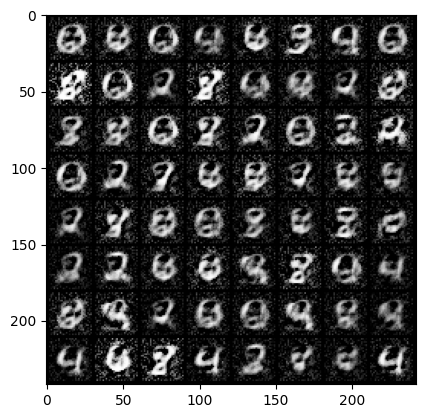

Epoch [58/80] Batch 0/938             Loss D: 0.2680, Loss G: 4.7576
Epoch [58/80] Batch 100/938             Loss D: 0.2915, Loss G: 4.9488
Epoch [58/80] Batch 200/938             Loss D: 0.2805, Loss G: 4.4568
Epoch [58/80] Batch 300/938             Loss D: 0.2394, Loss G: 3.9501
Epoch [58/80] Batch 400/938             Loss D: 0.2692, Loss G: 4.1130
Epoch [58/80] Batch 500/938             Loss D: 0.2345, Loss G: 4.4744
Epoch [58/80] Batch 600/938             Loss D: 0.2538, Loss G: 3.2159
Epoch [58/80] Batch 700/938             Loss D: 0.1307, Loss G: 4.2303
Epoch [58/80] Batch 800/938             Loss D: 0.1992, Loss G: 4.1009
Epoch [58/80] Batch 900/938             Loss D: 0.2784, Loss G: 4.5130


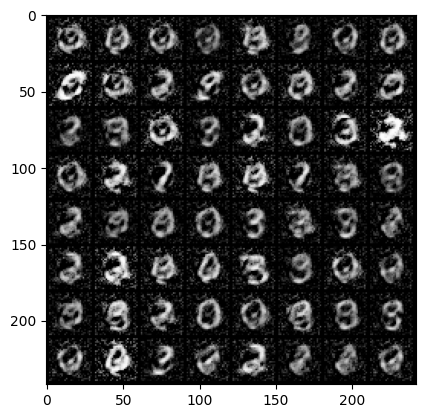

Epoch [59/80] Batch 0/938             Loss D: 0.1195, Loss G: 4.7221
Epoch [59/80] Batch 100/938             Loss D: 0.2457, Loss G: 4.8272
Epoch [59/80] Batch 200/938             Loss D: 0.2213, Loss G: 4.5955
Epoch [59/80] Batch 300/938             Loss D: 0.2253, Loss G: 3.7279
Epoch [59/80] Batch 400/938             Loss D: 0.2308, Loss G: 4.0736
Epoch [59/80] Batch 500/938             Loss D: 0.1329, Loss G: 4.6393
Epoch [59/80] Batch 600/938             Loss D: 0.3439, Loss G: 5.2899
Epoch [59/80] Batch 700/938             Loss D: 0.2190, Loss G: 4.3330
Epoch [59/80] Batch 800/938             Loss D: 0.3075, Loss G: 3.6899
Epoch [59/80] Batch 900/938             Loss D: 0.1237, Loss G: 5.4531


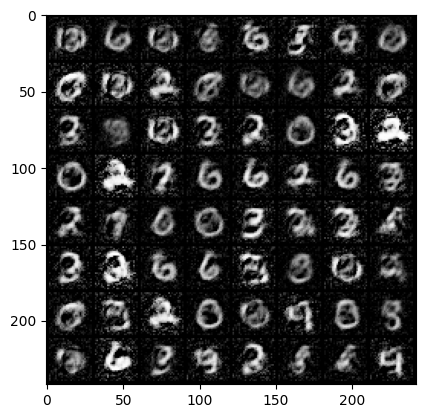

Epoch [60/80] Batch 0/938             Loss D: 0.2610, Loss G: 3.4351
Epoch [60/80] Batch 100/938             Loss D: 0.1731, Loss G: 3.6078
Epoch [60/80] Batch 200/938             Loss D: 0.2821, Loss G: 4.1395
Epoch [60/80] Batch 300/938             Loss D: 0.2009, Loss G: 4.2515
Epoch [60/80] Batch 400/938             Loss D: 0.5408, Loss G: 4.0433
Epoch [60/80] Batch 500/938             Loss D: 0.2197, Loss G: 4.1552
Epoch [60/80] Batch 600/938             Loss D: 0.1846, Loss G: 4.1993
Epoch [60/80] Batch 700/938             Loss D: 0.1492, Loss G: 3.8580
Epoch [60/80] Batch 800/938             Loss D: 0.3189, Loss G: 4.1971
Epoch [60/80] Batch 900/938             Loss D: 0.2047, Loss G: 3.7759


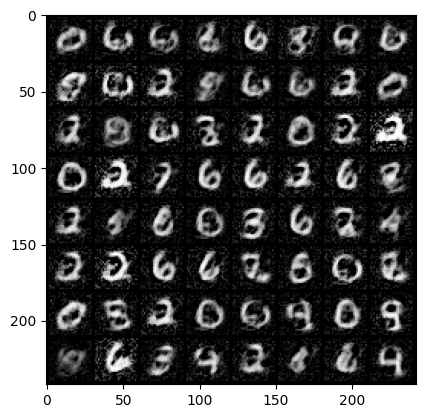

Epoch [61/80] Batch 0/938             Loss D: 0.2868, Loss G: 3.4815
Epoch [61/80] Batch 100/938             Loss D: 0.3331, Loss G: 3.3503
Epoch [61/80] Batch 200/938             Loss D: 0.1012, Loss G: 4.4710
Epoch [61/80] Batch 300/938             Loss D: 0.2568, Loss G: 3.8697
Epoch [61/80] Batch 400/938             Loss D: 0.5332, Loss G: 3.6202
Epoch [61/80] Batch 500/938             Loss D: 0.3263, Loss G: 3.5799
Epoch [61/80] Batch 600/938             Loss D: 0.2368, Loss G: 3.9225
Epoch [61/80] Batch 700/938             Loss D: 0.5307, Loss G: 3.6645
Epoch [61/80] Batch 800/938             Loss D: 0.3315, Loss G: 3.6976
Epoch [61/80] Batch 900/938             Loss D: 0.1673, Loss G: 4.0791


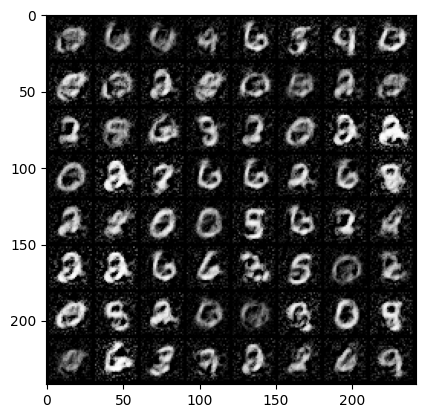

Epoch [62/80] Batch 0/938             Loss D: 0.2478, Loss G: 4.2779
Epoch [62/80] Batch 100/938             Loss D: 0.3643, Loss G: 3.2335
Epoch [62/80] Batch 200/938             Loss D: 0.3179, Loss G: 4.7419
Epoch [62/80] Batch 300/938             Loss D: 0.3232, Loss G: 3.8035
Epoch [62/80] Batch 400/938             Loss D: 0.1446, Loss G: 4.8604
Epoch [62/80] Batch 500/938             Loss D: 0.1372, Loss G: 4.3431
Epoch [62/80] Batch 600/938             Loss D: 0.2647, Loss G: 4.4318
Epoch [62/80] Batch 700/938             Loss D: 0.4103, Loss G: 3.4749
Epoch [62/80] Batch 800/938             Loss D: 0.2192, Loss G: 4.4069
Epoch [62/80] Batch 900/938             Loss D: 0.3180, Loss G: 3.5602


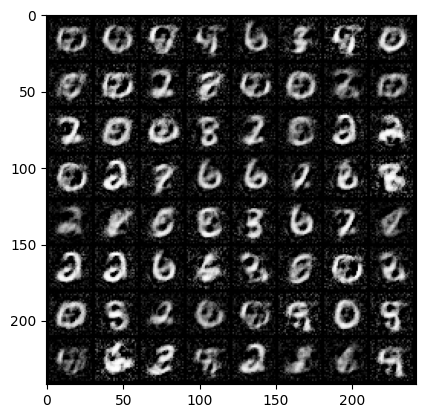

Epoch [63/80] Batch 0/938             Loss D: 0.4584, Loss G: 3.4413
Epoch [63/80] Batch 100/938             Loss D: 0.5590, Loss G: 4.6147
Epoch [63/80] Batch 200/938             Loss D: 0.4352, Loss G: 3.1303
Epoch [63/80] Batch 300/938             Loss D: 0.2380, Loss G: 3.9448
Epoch [63/80] Batch 400/938             Loss D: 0.2586, Loss G: 3.1705
Epoch [63/80] Batch 500/938             Loss D: 0.2403, Loss G: 3.4203
Epoch [63/80] Batch 600/938             Loss D: 0.1813, Loss G: 3.7236
Epoch [63/80] Batch 700/938             Loss D: 0.3267, Loss G: 5.3577
Epoch [63/80] Batch 800/938             Loss D: 0.3035, Loss G: 3.6435
Epoch [63/80] Batch 900/938             Loss D: 0.1965, Loss G: 4.7234


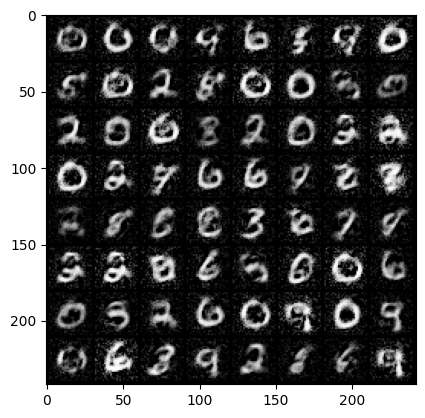

Epoch [64/80] Batch 0/938             Loss D: 0.2145, Loss G: 4.0810
Epoch [64/80] Batch 100/938             Loss D: 0.3536, Loss G: 3.2787
Epoch [64/80] Batch 200/938             Loss D: 0.3188, Loss G: 3.5205
Epoch [64/80] Batch 300/938             Loss D: 0.3071, Loss G: 3.2393
Epoch [64/80] Batch 400/938             Loss D: 0.5354, Loss G: 3.9475
Epoch [64/80] Batch 500/938             Loss D: 0.3772, Loss G: 3.4901
Epoch [64/80] Batch 600/938             Loss D: 0.2517, Loss G: 3.6970
Epoch [64/80] Batch 700/938             Loss D: 0.3527, Loss G: 3.3136
Epoch [64/80] Batch 800/938             Loss D: 0.3367, Loss G: 4.1777
Epoch [64/80] Batch 900/938             Loss D: 0.3113, Loss G: 3.5988


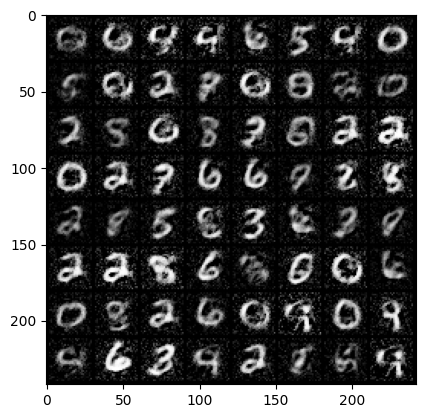

Epoch [65/80] Batch 0/938             Loss D: 0.2289, Loss G: 3.8258
Epoch [65/80] Batch 100/938             Loss D: 0.3085, Loss G: 4.4075
Epoch [65/80] Batch 200/938             Loss D: 0.3133, Loss G: 3.5383
Epoch [65/80] Batch 300/938             Loss D: 0.3400, Loss G: 5.1522
Epoch [65/80] Batch 400/938             Loss D: 0.3339, Loss G: 4.4736
Epoch [65/80] Batch 500/938             Loss D: 0.2597, Loss G: 3.5607
Epoch [65/80] Batch 600/938             Loss D: 0.1908, Loss G: 3.7765
Epoch [65/80] Batch 700/938             Loss D: 0.2666, Loss G: 3.9050
Epoch [65/80] Batch 800/938             Loss D: 0.2357, Loss G: 3.3108
Epoch [65/80] Batch 900/938             Loss D: 0.3503, Loss G: 4.1923


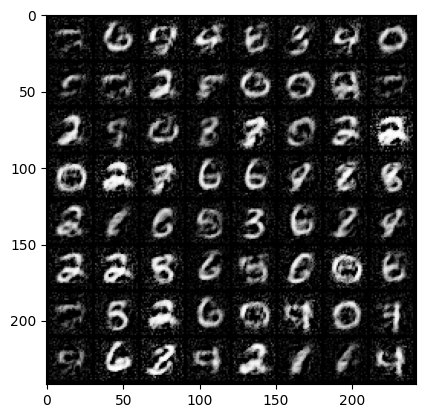

Epoch [66/80] Batch 0/938             Loss D: 0.2955, Loss G: 4.1842
Epoch [66/80] Batch 100/938             Loss D: 0.2624, Loss G: 3.1500
Epoch [66/80] Batch 200/938             Loss D: 0.2235, Loss G: 3.5305
Epoch [66/80] Batch 300/938             Loss D: 0.3535, Loss G: 3.7815
Epoch [66/80] Batch 400/938             Loss D: 0.3665, Loss G: 3.5906
Epoch [66/80] Batch 500/938             Loss D: 0.2847, Loss G: 3.7274
Epoch [66/80] Batch 600/938             Loss D: 0.5118, Loss G: 4.0232
Epoch [66/80] Batch 700/938             Loss D: 0.3844, Loss G: 2.9451
Epoch [66/80] Batch 800/938             Loss D: 0.4334, Loss G: 4.0204
Epoch [66/80] Batch 900/938             Loss D: 0.3794, Loss G: 3.6876


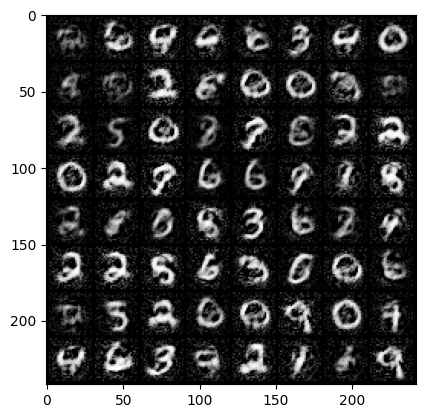

Epoch [67/80] Batch 0/938             Loss D: 0.1721, Loss G: 3.8513
Epoch [67/80] Batch 100/938             Loss D: 0.5019, Loss G: 3.2354
Epoch [67/80] Batch 200/938             Loss D: 0.3315, Loss G: 4.4579
Epoch [67/80] Batch 300/938             Loss D: 0.2821, Loss G: 3.4452
Epoch [67/80] Batch 400/938             Loss D: 0.3825, Loss G: 3.8143
Epoch [67/80] Batch 500/938             Loss D: 0.3562, Loss G: 3.3605
Epoch [67/80] Batch 600/938             Loss D: 0.2310, Loss G: 4.5413
Epoch [67/80] Batch 700/938             Loss D: 0.3187, Loss G: 3.7437
Epoch [67/80] Batch 800/938             Loss D: 0.2485, Loss G: 3.6298
Epoch [67/80] Batch 900/938             Loss D: 0.4034, Loss G: 5.0191


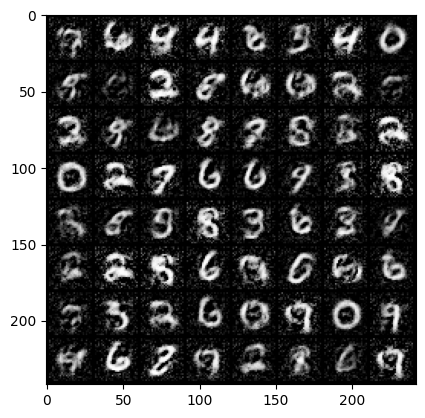

Epoch [68/80] Batch 0/938             Loss D: 0.2474, Loss G: 4.9663
Epoch [68/80] Batch 100/938             Loss D: 0.2424, Loss G: 3.3853
Epoch [68/80] Batch 200/938             Loss D: 0.4247, Loss G: 4.2938
Epoch [68/80] Batch 300/938             Loss D: 0.1653, Loss G: 4.0198
Epoch [68/80] Batch 400/938             Loss D: 0.2857, Loss G: 3.6682
Epoch [68/80] Batch 500/938             Loss D: 0.1590, Loss G: 3.9086
Epoch [68/80] Batch 600/938             Loss D: 0.2296, Loss G: 4.1302
Epoch [68/80] Batch 700/938             Loss D: 0.4284, Loss G: 3.2578
Epoch [68/80] Batch 800/938             Loss D: 0.2709, Loss G: 3.2310
Epoch [68/80] Batch 900/938             Loss D: 0.1841, Loss G: 3.9674


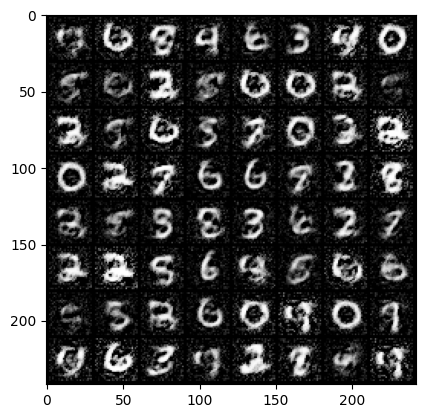

Epoch [69/80] Batch 0/938             Loss D: 0.2978, Loss G: 4.1429
Epoch [69/80] Batch 100/938             Loss D: 0.3849, Loss G: 3.2083
Epoch [69/80] Batch 200/938             Loss D: 0.3864, Loss G: 3.4593
Epoch [69/80] Batch 300/938             Loss D: 0.4764, Loss G: 4.4142
Epoch [69/80] Batch 400/938             Loss D: 0.3378, Loss G: 3.2976
Epoch [69/80] Batch 500/938             Loss D: 0.3493, Loss G: 3.8292
Epoch [69/80] Batch 600/938             Loss D: 0.1927, Loss G: 4.3722
Epoch [69/80] Batch 700/938             Loss D: 0.2029, Loss G: 4.1831
Epoch [69/80] Batch 800/938             Loss D: 0.2834, Loss G: 4.5491
Epoch [69/80] Batch 900/938             Loss D: 0.3041, Loss G: 4.6902


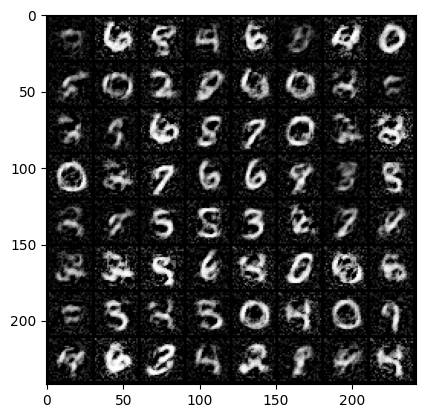

Epoch [70/80] Batch 0/938             Loss D: 0.2261, Loss G: 3.9459
Epoch [70/80] Batch 100/938             Loss D: 0.2945, Loss G: 4.3350
Epoch [70/80] Batch 200/938             Loss D: 0.2268, Loss G: 3.0733
Epoch [70/80] Batch 300/938             Loss D: 0.2815, Loss G: 3.8462
Epoch [70/80] Batch 400/938             Loss D: 0.2162, Loss G: 3.7585
Epoch [70/80] Batch 500/938             Loss D: 0.3166, Loss G: 3.4971
Epoch [70/80] Batch 600/938             Loss D: 0.3195, Loss G: 4.3935
Epoch [70/80] Batch 700/938             Loss D: 0.4416, Loss G: 3.8881
Epoch [70/80] Batch 800/938             Loss D: 0.2579, Loss G: 4.0040
Epoch [70/80] Batch 900/938             Loss D: 0.2669, Loss G: 3.9795


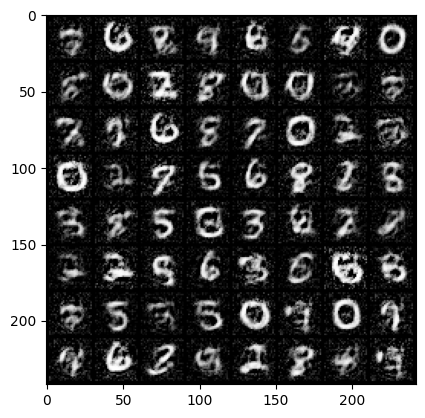

Epoch [71/80] Batch 0/938             Loss D: 0.4533, Loss G: 3.3829
Epoch [71/80] Batch 100/938             Loss D: 0.3346, Loss G: 4.5437
Epoch [71/80] Batch 200/938             Loss D: 0.2405, Loss G: 3.5504
Epoch [71/80] Batch 300/938             Loss D: 0.1960, Loss G: 3.9484
Epoch [71/80] Batch 400/938             Loss D: 0.4451, Loss G: 4.4349
Epoch [71/80] Batch 500/938             Loss D: 0.2309, Loss G: 3.6526
Epoch [71/80] Batch 600/938             Loss D: 0.4061, Loss G: 3.6883
Epoch [71/80] Batch 700/938             Loss D: 0.2957, Loss G: 4.0120
Epoch [71/80] Batch 800/938             Loss D: 0.3979, Loss G: 3.8702
Epoch [71/80] Batch 900/938             Loss D: 0.2070, Loss G: 4.2186


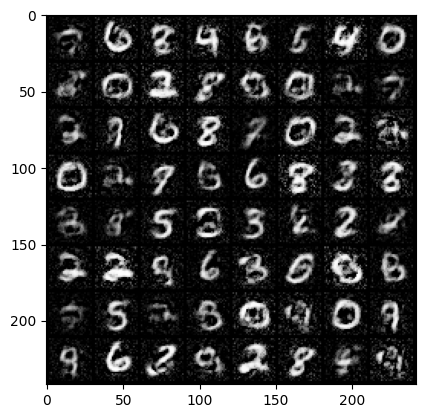

Epoch [72/80] Batch 0/938             Loss D: 0.3413, Loss G: 3.9621
Epoch [72/80] Batch 100/938             Loss D: 0.4613, Loss G: 3.7560
Epoch [72/80] Batch 200/938             Loss D: 0.2266, Loss G: 3.6631
Epoch [72/80] Batch 300/938             Loss D: 0.2043, Loss G: 3.7236
Epoch [72/80] Batch 400/938             Loss D: 0.2022, Loss G: 3.7221
Epoch [72/80] Batch 500/938             Loss D: 0.7175, Loss G: 4.0946
Epoch [72/80] Batch 600/938             Loss D: 0.2649, Loss G: 4.2556
Epoch [72/80] Batch 700/938             Loss D: 0.2298, Loss G: 3.8833
Epoch [72/80] Batch 800/938             Loss D: 0.2603, Loss G: 3.9777
Epoch [72/80] Batch 900/938             Loss D: 0.3648, Loss G: 3.4028


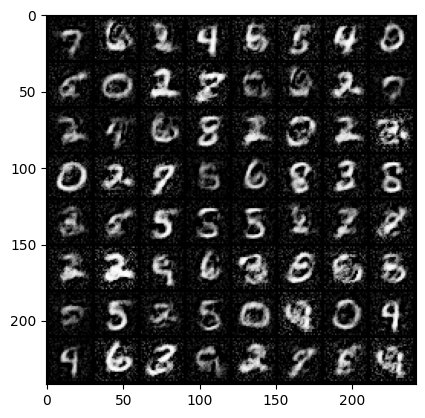

Epoch [73/80] Batch 0/938             Loss D: 0.2005, Loss G: 3.7842
Epoch [73/80] Batch 100/938             Loss D: 0.1555, Loss G: 4.2990
Epoch [73/80] Batch 200/938             Loss D: 0.3987, Loss G: 3.8339
Epoch [73/80] Batch 300/938             Loss D: 0.2218, Loss G: 4.4007
Epoch [73/80] Batch 400/938             Loss D: 0.2833, Loss G: 4.3803
Epoch [73/80] Batch 500/938             Loss D: 0.2418, Loss G: 3.9736
Epoch [73/80] Batch 600/938             Loss D: 0.2773, Loss G: 3.0989
Epoch [73/80] Batch 700/938             Loss D: 0.3861, Loss G: 3.8597
Epoch [73/80] Batch 800/938             Loss D: 0.3186, Loss G: 4.8528
Epoch [73/80] Batch 900/938             Loss D: 0.3827, Loss G: 3.5101


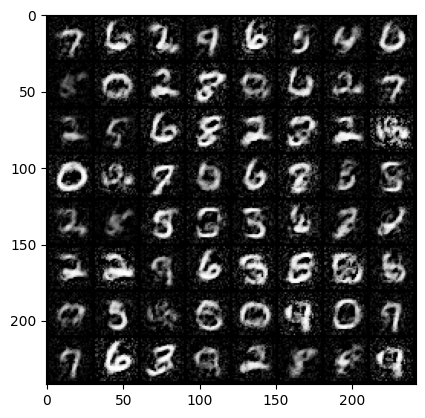

Epoch [74/80] Batch 0/938             Loss D: 0.4591, Loss G: 3.4462
Epoch [74/80] Batch 100/938             Loss D: 0.2627, Loss G: 3.4426
Epoch [74/80] Batch 200/938             Loss D: 0.2754, Loss G: 3.9878
Epoch [74/80] Batch 300/938             Loss D: 0.2448, Loss G: 3.8424
Epoch [74/80] Batch 400/938             Loss D: 0.2970, Loss G: 4.1549
Epoch [74/80] Batch 500/938             Loss D: 0.1916, Loss G: 4.1673
Epoch [74/80] Batch 600/938             Loss D: 0.2639, Loss G: 3.8433
Epoch [74/80] Batch 700/938             Loss D: 0.2118, Loss G: 3.8638
Epoch [74/80] Batch 800/938             Loss D: 0.3236, Loss G: 4.5700
Epoch [74/80] Batch 900/938             Loss D: 0.3189, Loss G: 4.3413


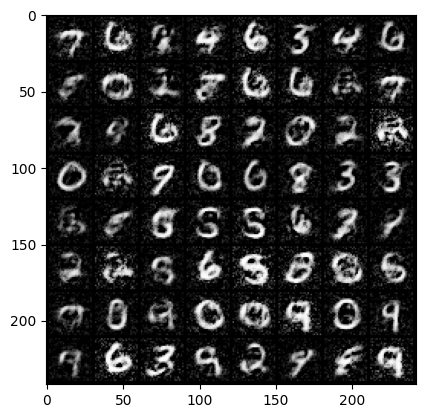

Epoch [75/80] Batch 0/938             Loss D: 0.3385, Loss G: 4.4018
Epoch [75/80] Batch 100/938             Loss D: 0.2912, Loss G: 4.4770
Epoch [75/80] Batch 200/938             Loss D: 0.2644, Loss G: 3.9973
Epoch [75/80] Batch 300/938             Loss D: 0.4352, Loss G: 3.9260
Epoch [75/80] Batch 400/938             Loss D: 0.2097, Loss G: 3.8498
Epoch [75/80] Batch 500/938             Loss D: 0.4882, Loss G: 3.6641
Epoch [75/80] Batch 600/938             Loss D: 0.3066, Loss G: 4.4970
Epoch [75/80] Batch 700/938             Loss D: 0.3533, Loss G: 3.6685
Epoch [75/80] Batch 800/938             Loss D: 0.2792, Loss G: 3.7129
Epoch [75/80] Batch 900/938             Loss D: 0.1737, Loss G: 3.4203


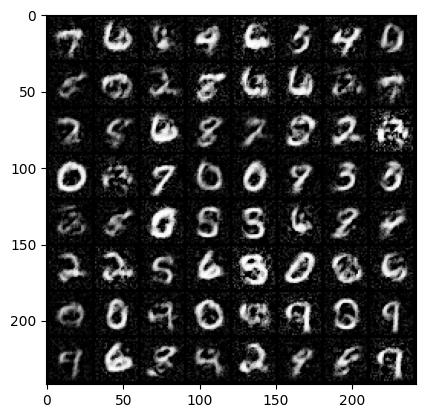

Epoch [76/80] Batch 0/938             Loss D: 0.2950, Loss G: 3.5357
Epoch [76/80] Batch 100/938             Loss D: 0.3164, Loss G: 4.0247
Epoch [76/80] Batch 200/938             Loss D: 0.4351, Loss G: 3.3429
Epoch [76/80] Batch 300/938             Loss D: 0.5789, Loss G: 3.3995
Epoch [76/80] Batch 400/938             Loss D: 0.3303, Loss G: 4.4579
Epoch [76/80] Batch 500/938             Loss D: 0.2525, Loss G: 3.7998
Epoch [76/80] Batch 600/938             Loss D: 0.4396, Loss G: 4.0612
Epoch [76/80] Batch 700/938             Loss D: 0.2740, Loss G: 4.0694
Epoch [76/80] Batch 800/938             Loss D: 0.2746, Loss G: 4.1001
Epoch [76/80] Batch 900/938             Loss D: 0.2921, Loss G: 3.6479


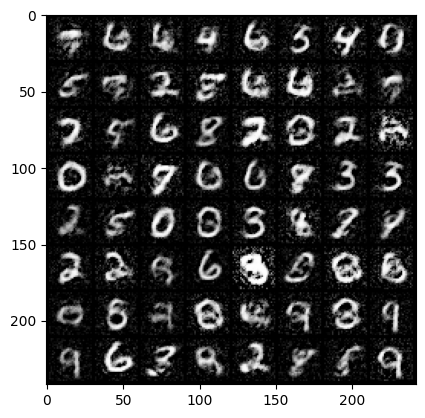

Epoch [77/80] Batch 0/938             Loss D: 0.4029, Loss G: 3.1969
Epoch [77/80] Batch 100/938             Loss D: 0.3974, Loss G: 4.2122
Epoch [77/80] Batch 200/938             Loss D: 0.3686, Loss G: 3.7424
Epoch [77/80] Batch 300/938             Loss D: 0.2190, Loss G: 3.6083
Epoch [77/80] Batch 400/938             Loss D: 0.5771, Loss G: 4.3529
Epoch [77/80] Batch 500/938             Loss D: 0.2407, Loss G: 4.1596
Epoch [77/80] Batch 600/938             Loss D: 0.3606, Loss G: 3.8885
Epoch [77/80] Batch 700/938             Loss D: 0.2954, Loss G: 3.9147
Epoch [77/80] Batch 800/938             Loss D: 0.2540, Loss G: 4.4934
Epoch [77/80] Batch 900/938             Loss D: 0.2689, Loss G: 3.6579


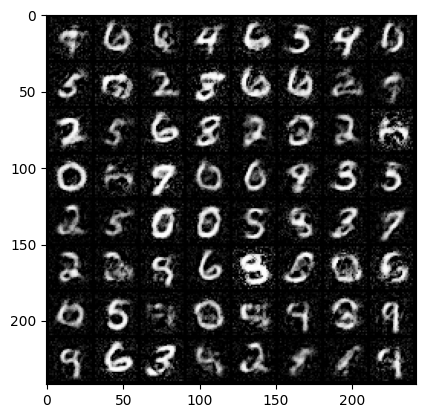

Epoch [78/80] Batch 0/938             Loss D: 0.2983, Loss G: 3.4694
Epoch [78/80] Batch 100/938             Loss D: 0.2791, Loss G: 3.4386
Epoch [78/80] Batch 200/938             Loss D: 0.3415, Loss G: 4.1312
Epoch [78/80] Batch 300/938             Loss D: 0.3429, Loss G: 4.3409
Epoch [78/80] Batch 400/938             Loss D: 0.4912, Loss G: 3.9856
Epoch [78/80] Batch 500/938             Loss D: 0.3247, Loss G: 4.3876
Epoch [78/80] Batch 600/938             Loss D: 0.2753, Loss G: 4.5195
Epoch [78/80] Batch 700/938             Loss D: 0.2255, Loss G: 4.3619
Epoch [78/80] Batch 800/938             Loss D: 0.3183, Loss G: 3.3223
Epoch [78/80] Batch 900/938             Loss D: 0.2426, Loss G: 3.4762


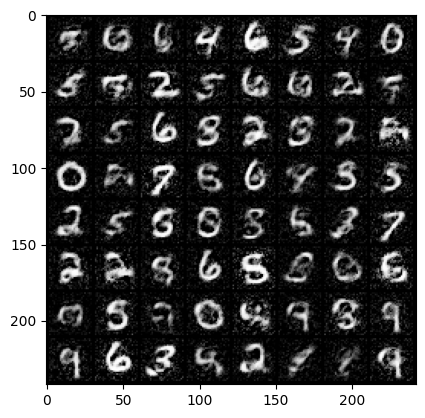

Epoch [79/80] Batch 0/938             Loss D: 0.1979, Loss G: 4.1614
Epoch [79/80] Batch 100/938             Loss D: 0.4996, Loss G: 3.3954
Epoch [79/80] Batch 200/938             Loss D: 0.3127, Loss G: 3.6688
Epoch [79/80] Batch 300/938             Loss D: 0.2716, Loss G: 3.8761
Epoch [79/80] Batch 400/938             Loss D: 0.3472, Loss G: 3.8110
Epoch [79/80] Batch 500/938             Loss D: 0.3092, Loss G: 4.1032
Epoch [79/80] Batch 600/938             Loss D: 0.3136, Loss G: 3.7791
Epoch [79/80] Batch 700/938             Loss D: 0.3339, Loss G: 3.6522
Epoch [79/80] Batch 800/938             Loss D: 0.3098, Loss G: 3.8620
Epoch [79/80] Batch 900/938             Loss D: 0.4378, Loss G: 3.6976


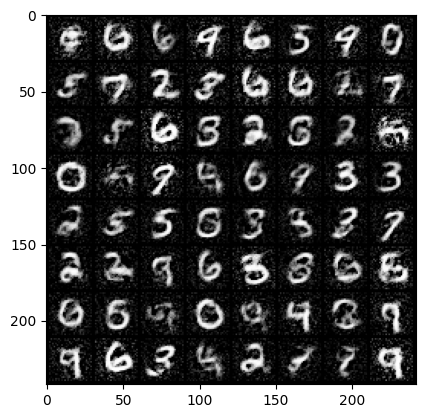

In [77]:
#Setting up the parameter and preparing the data
num_epochs = 80
fixed_noise = torch.randn(64,100)

for epoch in range(num_epochs):
  for i,(data,_) in enumerate(trainloader):
    real_data = data
    batch_size = real_data.size(0)

    #Train the discriminator
    #Generate Fake Data
    noise = torch.randn(batch_size,100)
    fake_data = generator(noise)

    label_real = torch.full((batch_size,),1,dtype=torch.float)
    label_fake = torch.full((batch_size,),0,dtype=torch.float)

    output_real = discriminator(real_data).view(-1)
    lossD_real = criterion(output_real,label_real)

    output_fake = discriminator(fake_data.detach()).view(-1)
    lossD_fake = criterion(output_fake,label_fake)

    lossD = lossD_real + lossD_fake

    OptimizerD.zero_grad()
    lossD.backward()
    OptimizerD.step()

    #Train the generator
    output_fake = discriminator(fake_data).view(-1)
    lossG = criterion(output_fake,label_real)

    OptimizerG.zero_grad()
    lossG.backward()
    OptimizerG.step()


    #Visualizing the results of training
    #Epoch [0/80] Batch 0/938                   Loss D: 1.3865, Loss G: 0.6956

    if i % 100 == 0:
      print(f'Epoch [{epoch}/{num_epochs}] Batch {i}/{len(trainloader)} \
            Loss D: {lossD.item():.4f}, Loss G: {lossG.item():.4f}')

  with torch.no_grad():
      fake_images = generator(fixed_noise).detach()
  img_grid = torchvision.utils.make_grid(fake_images)  # (Channel,Height,Width)
  np_img = img_grid.numpy()
  plt.imshow(np.transpose(np_img,(1,2,0)))  #(Height,Width,Channel)
  plt.show()